In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error as mae
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import PolynomialFeatures

# Load the data
mlr_data = pd.read_csv('/Users/jjy/Desktop/MLR Data/mlr_data.csv')

# Display the first few rows to understand the structure
print(mlr_data.head())



  well_id replicate_number assay_type assay_number treatment_1  \
0     A04               R1    CD8 MLR        MLR63     GEN1056   
1     A04               R1    CD8 MLR        MLR63     GEN1056   
2     A04               R1    CD8 MLR        MLR63     GEN1056   
3     A04               R1    CD8 MLR        MLR63     GEN1056   
4     A04               R1    CD8 MLR        MLR63     GEN1056   

   concentration_1 treatment_2  concentration_2 donor_1_type  \
0            100.0     GEN1053             30.0     DC Donor   
1            100.0     GEN1053             30.0     DC Donor   
2            100.0     GEN1053             30.0     DC Donor   
3            100.0     GEN1053             30.0     DC Donor   
4            100.0     GEN1053             30.0     DC Donor   

          donor_1_id  donor_2_type         donor_2_id scientist   analyte  \
0  LS112418861 58355  T cell Donor  LS1170885 CC00481      NACH     IL-10   
1  LS112418861 58355  T cell Donor  LS1170885 CC00481      NACH 

/var/folders/wx/_sxsvv513r3fmy2qd036wn500000gn/T/ipykernel_78292/3697649020.py:17: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(mlr_data[treatment_col], shade=True)


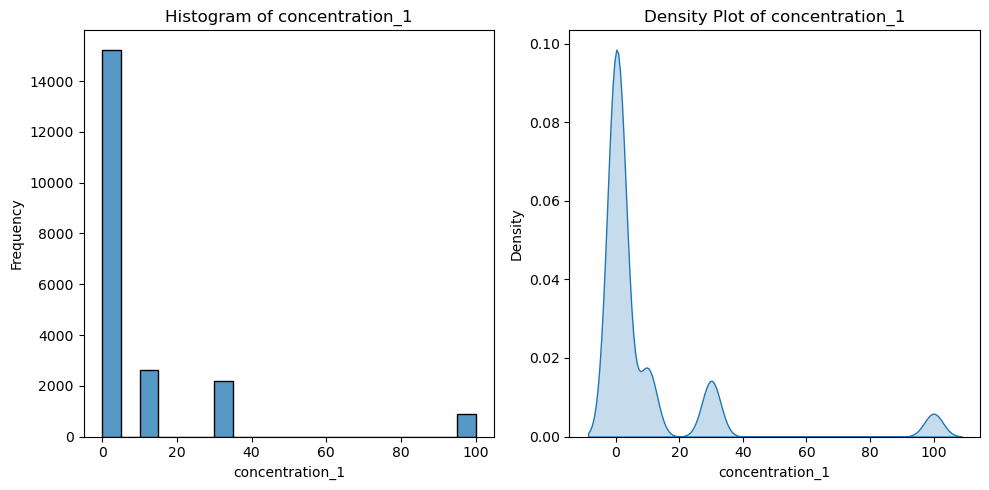

/var/folders/wx/_sxsvv513r3fmy2qd036wn500000gn/T/ipykernel_78292/3697649020.py:17: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(mlr_data[treatment_col], shade=True)


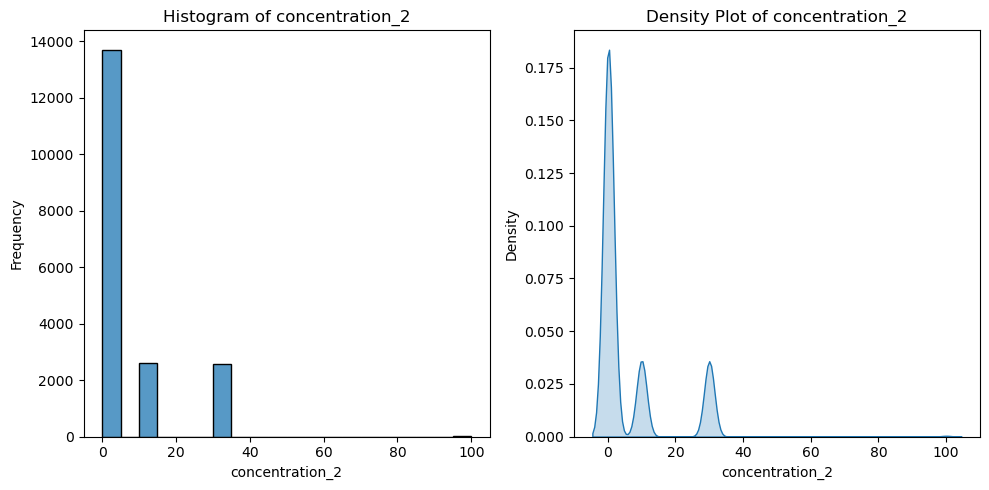

In [27]:
# Assuming the data has columns for treatments and cytokines, replace these column names with actual ones
treatment1_col = 'concentration_1'
treatment2_col = 'concentration_2'

for treatment_col in [treatment1_col, treatment2_col]:
    plt.figure(figsize=(10, 5))
    
    # Histogram plot
    plt.subplot(1, 2, 1)
    sns.histplot(mlr_data[treatment_col], kde=False, bins=20)
    plt.title(f'Histogram of {treatment_col}')
    plt.xlabel(treatment_col)
    plt.ylabel('Frequency')

    # Density plot
    plt.subplot(1, 2, 2)
    sns.kdeplot(mlr_data[treatment_col], shade=True)
    plt.title(f'Density Plot of {treatment_col}')
    plt.xlabel(treatment_col)
    plt.ylabel('Density')
    
    plt.tight_layout()
    plt.show()

In [41]:
"""
The design of this method is inspired by Rob Mulla on https://www.youtube.com/watch?v=QpzMWQvxXWk
"""
def plotable(treatment_1, treatment_2, analyte):
    data = mlr_data.loc[
        (mlr_data["treatment_1"] == treatment_1) & 
        (mlr_data["treatment_2"] == treatment_2) & 
        (mlr_data["analyte"] == analyte), 
        ["concentration_1", "concentration_2", "analyte_value"]
    ]
    
    # Check if the data has less than 10 samples
    if data.size<30:
        return False
    return True

In [47]:
"""
Part of code in this mehtod is adapted from https://matplotlib.org/stable/plot_types/3D/scatter3d_simple.html#sphx-glr-plot-types-3d-scatter3d-simple-py
and helped by other examples from the official website of matplotlib: https://matplotlib.org/stable/
"""
def plot(treatment_1, treatment_2, analyte):
    data = mlr_data.loc[
        (mlr_data["treatment_1"] == treatment_1) & 
        (mlr_data["treatment_2"] == treatment_2) & 
        (mlr_data["analyte"] == analyte), 
        ["concentration_1", "concentration_2", "analyte_value"]
    ]
    
    # Check if the data is empty
    if not plotable(treatment_1, treatment_2, analyte):
        print(f"Skipping {analyte} due to insufficient data.")
        return 
    
    xs = data["concentration_1"].values
    ys = data["concentration_2"].values
    zs = data["analyte_value"].values
    X = data[["concentration_1", "concentration_2"]]
    y = zs

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(data[["concentration_1", "concentration_2"]], zs)

    # Create a grid for plotting the regression plane
    x_pred = np.linspace(xs.min(), xs.max(), 30)
    y_pred = np.linspace(ys.min(), ys.max(), 30)
    x_pred, y_pred = np.meshgrid(x_pred, y_pred)
    z_pred = model.predict(np.c_[x_pred.ravel(), y_pred.ravel()]).reshape(x_pred.shape)
    
    # Compute the mean of cross validation results of mean absolute error
    cross_val_error = -cross_val_score(model, X, y, cv=5, scoring="neg_mean_absolute_error").mean()

    # Plot
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(xs, ys, zs, color='blue', label='Data points')
    ax.plot_surface(x_pred, y_pred, z_pred, color='red', alpha=0.5, rstride=100, cstride=100)
    
    # Adding contour plot
    contour = ax.contourf(x_pred, y_pred, z_pred, zdir='z', offset=zs.min(), cmap='viridis', alpha=0.5)
    fig.colorbar(contour, ax=ax, shrink=0.5, aspect=5)
    
    ax.set_xlabel(treatment_1 + " concentration")
    ax.set_ylabel(treatment_2 + " concentration")
    ax.set_zlabel(analyte + " value")
    ax.set_title(f"3D Surface Plot with Regression Plane and Contours for {analyte}" " Error: " + str(cross_val_error))
    ax.legend()
    plt.show()
    return cross_val_error

In [49]:
# Loop through each unique analyte and plot, skipping if insufficient data
unique_analytes = mlr_data['analyte'].unique()

In [51]:
def cross_val_mae(treatment_1, treatment_2, analyte, dimension=1):
    data = mlr_data.loc[
        (mlr_data["treatment_1"] == treatment_1) & 
        (mlr_data["treatment_2"] == treatment_2) & 
        (mlr_data["analyte"] == analyte), 
        ["concentration_1", "concentration_2", "analyte_value"]
    ]
    
    # Check if the data is empty
    if not plotable(treatment_1, treatment_2, analyte):
        return 
    
    X = data[["concentration_1", "concentration_2"]]
    y = data["analyte_value"].values
    polynomial = PolynomialFeatures(dimension)
    X = polynomial.fit_transform(X)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(X, y)

    # Compute the mean of cross validation results of mean absolute error
    cross_val_error = -cross_val_score(model, X, y, cv=5, scoring="neg_mean_absolute_error").mean()
    return cross_val_error
    

In [53]:
"""
Part of code in this mehtod is adapted from https://matplotlib.org/stable/plot_types/3D/scatter3d_simple.html#sphx-glr-plot-types-3d-scatter3d-simple-py
and helped by other examples from the official website of matplotlib: https://matplotlib.org/stable/
"""
def poly_plot(treatment_1, treatment_2, analyte, dimension):
    data = mlr_data.loc[
        (mlr_data["treatment_1"] == treatment_1) & 
        (mlr_data["treatment_2"] == treatment_2) & 
        (mlr_data["analyte"] == analyte), 
        ["concentration_1", "concentration_2", "analyte_value"]
    ]
    
    # Check if the data is empty
    if not plotable(treatment_1, treatment_2, analyte):
        print(f"Skipping {analyte} due to insufficient data.")
        return 
    
    xs = data["concentration_1"].values
    ys = data["concentration_2"].values
    zs = data["analyte_value"].values
    X = data[["concentration_1", "concentration_2"]]
    polynomial = PolynomialFeatures(dimension)
    X = polynomial.fit_transform(X)
    y = zs

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(data[["concentration_1", "concentration_2"]], zs)

    # Create a grid for plotting the regression plane
    x_pred = np.linspace(xs.min(), xs.max(), 30)
    y_pred = np.linspace(ys.min(), ys.max(), 30)
    x_pred, y_pred = np.meshgrid(x_pred, y_pred)
    z_pred = model.predict(np.c_[x_pred.ravel(), y_pred.ravel()]).reshape(x_pred.shape)
    
    # Compute the mean of cross validation results of mean absolute error
    cross_val_error = -cross_val_score(model, X, y, cv=5, scoring="neg_mean_absolute_error").mean()

    # Plot
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(xs, ys, zs, color='blue', label='Data points')
    ax.plot_surface(x_pred, y_pred, z_pred, color='red', alpha=0.5, rstride=100, cstride=100)
    
    # Adding contour plot
    contour = ax.contourf(x_pred, y_pred, z_pred, zdir='z', offset=zs.min(), cmap='viridis', alpha=0.5)
    fig.colorbar(contour, ax=ax, shrink=0.5, aspect=5)
    
    ax.set_xlabel(treatment_1 + " concentration")
    ax.set_ylabel(treatment_2 + " concentration")
    ax.set_zlabel(analyte + " value")
    ax.set_title(f"3D Surface Plot with Regression Plane and Contours for {analyte}" " Error: " + str(cross_val_error))
    ax.legend()
    plt.show()
    return cross_val_error

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


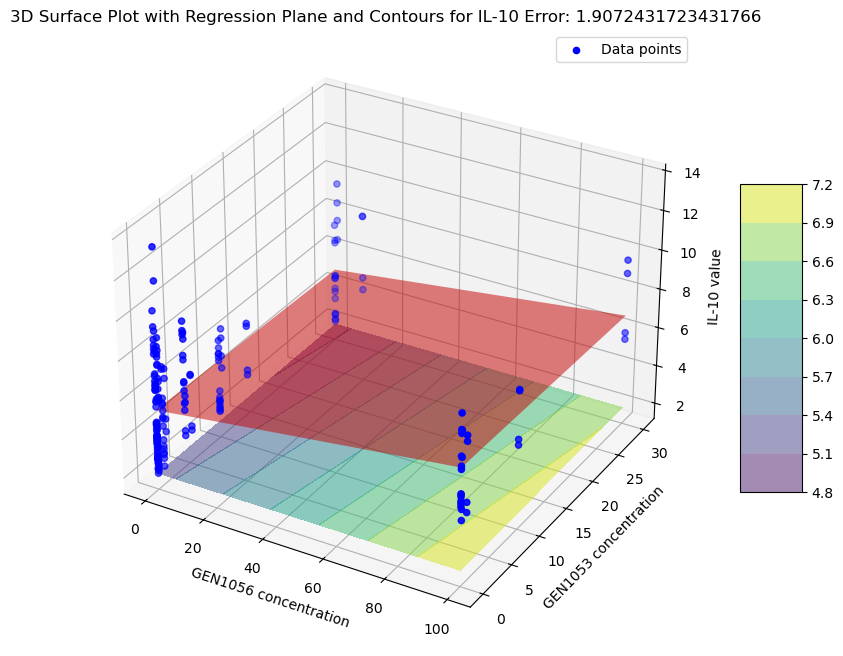

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


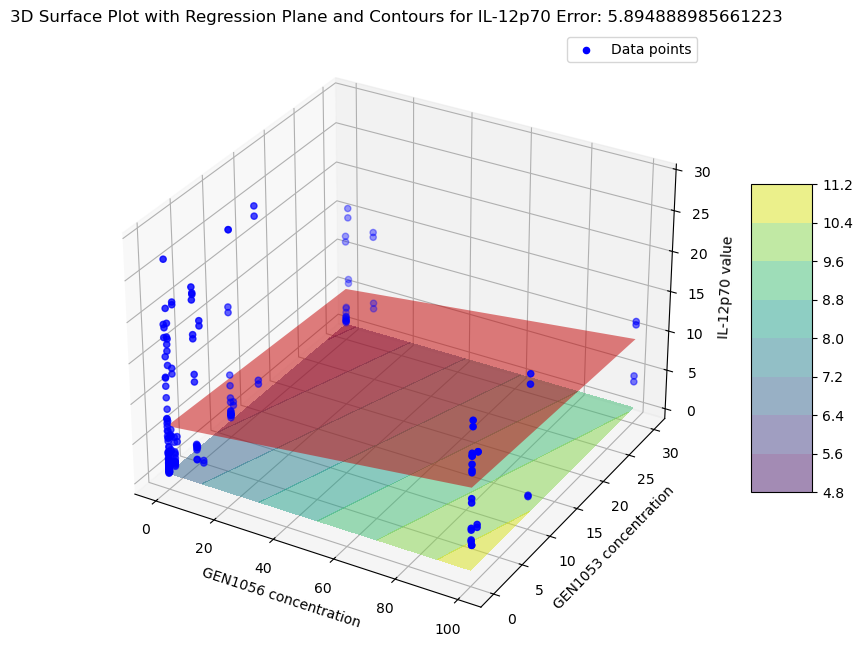

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


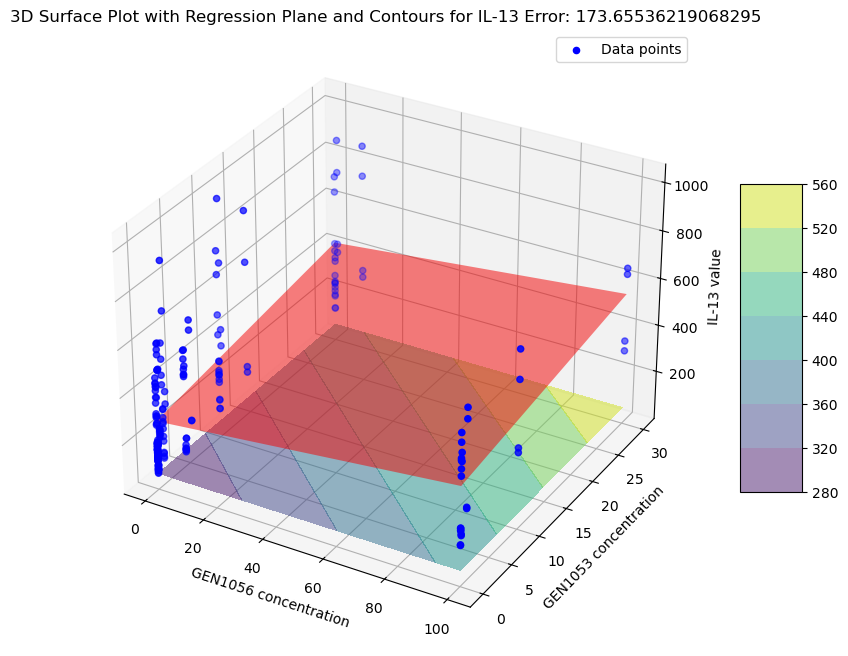

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


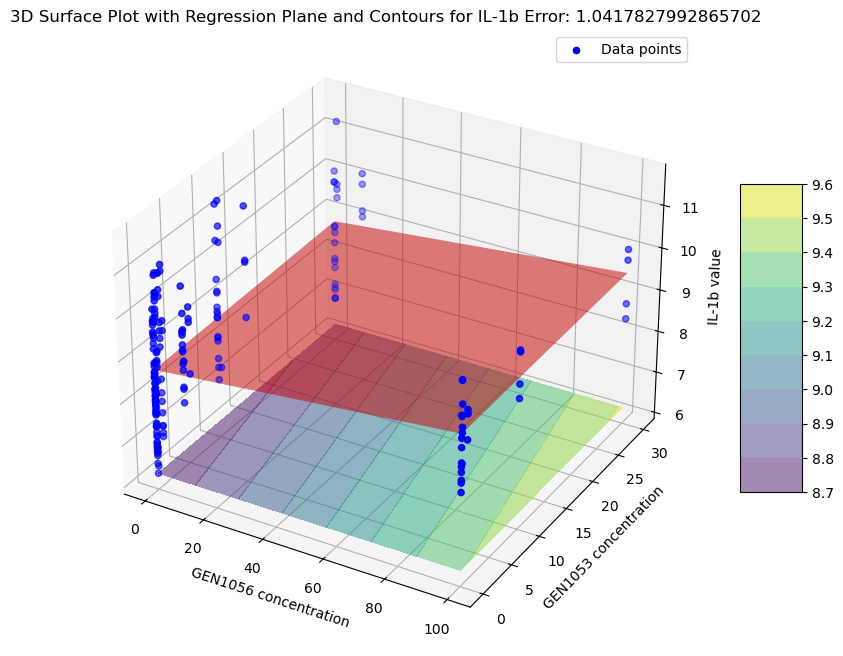

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


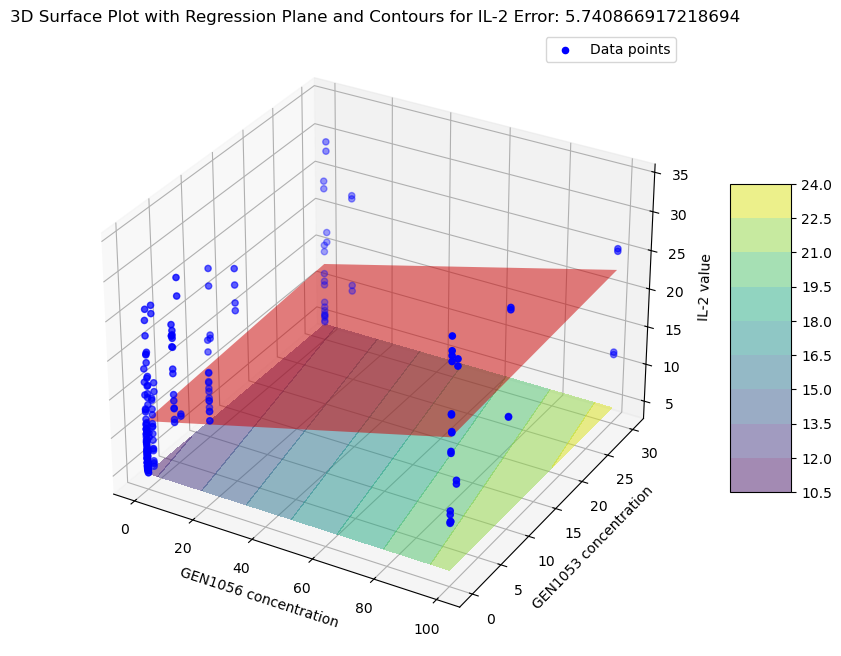

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


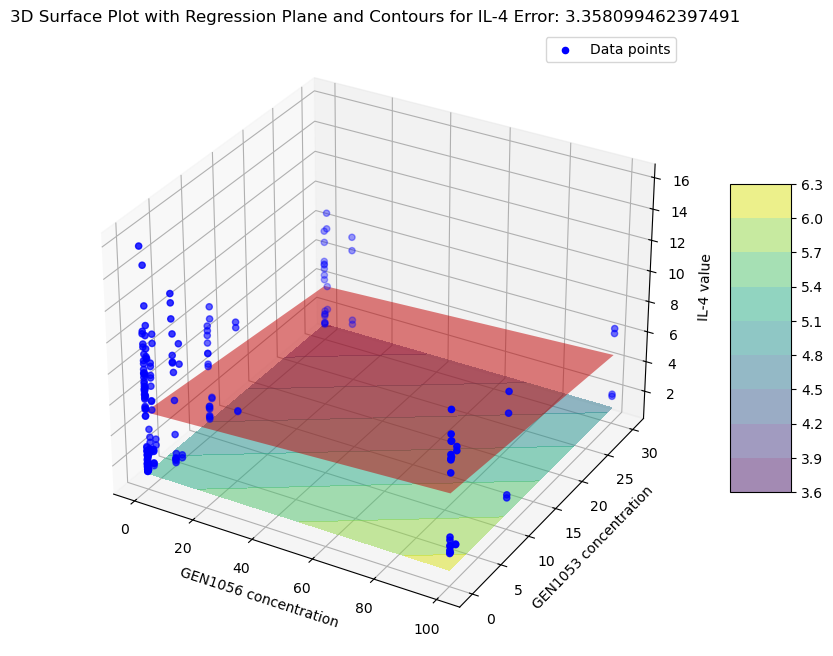

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


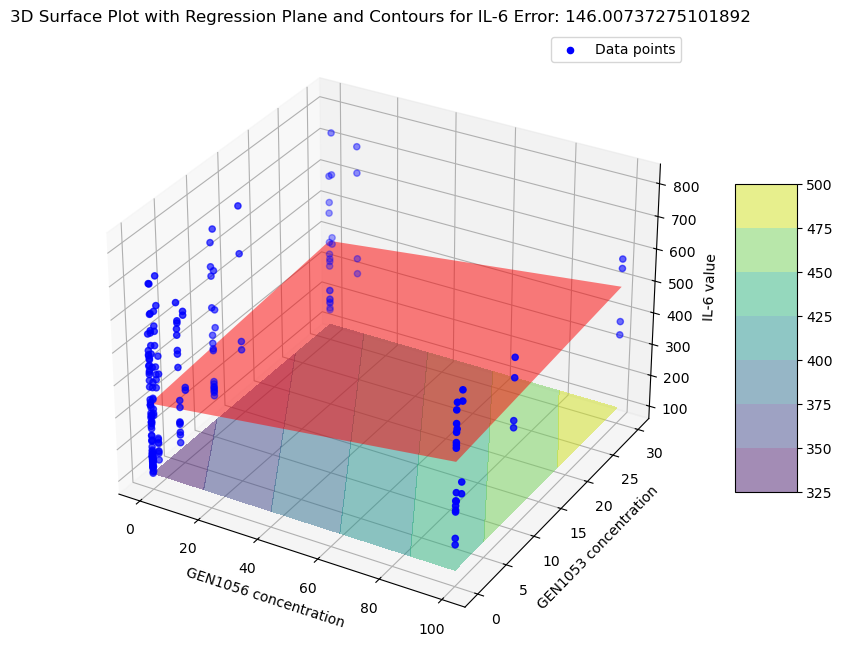

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


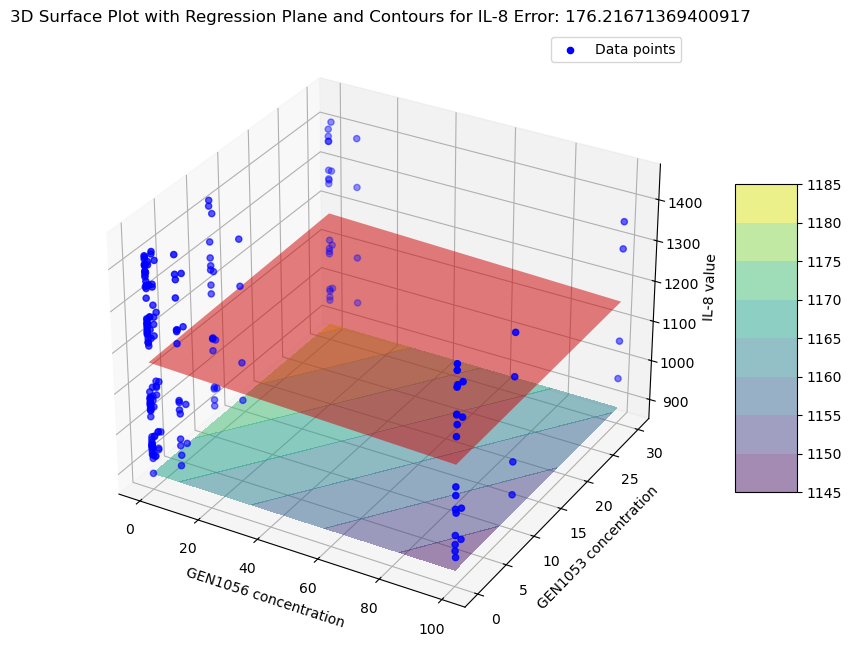

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


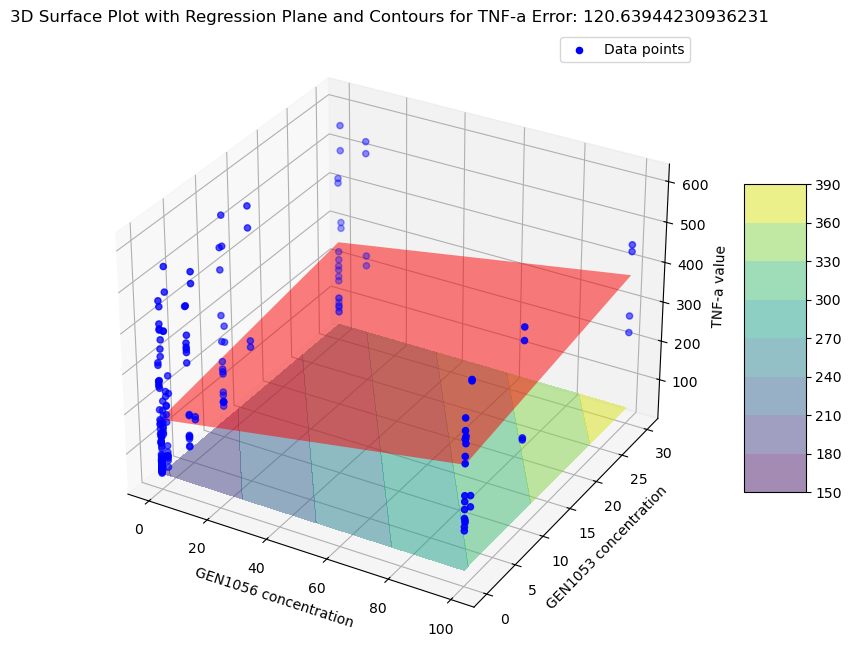

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


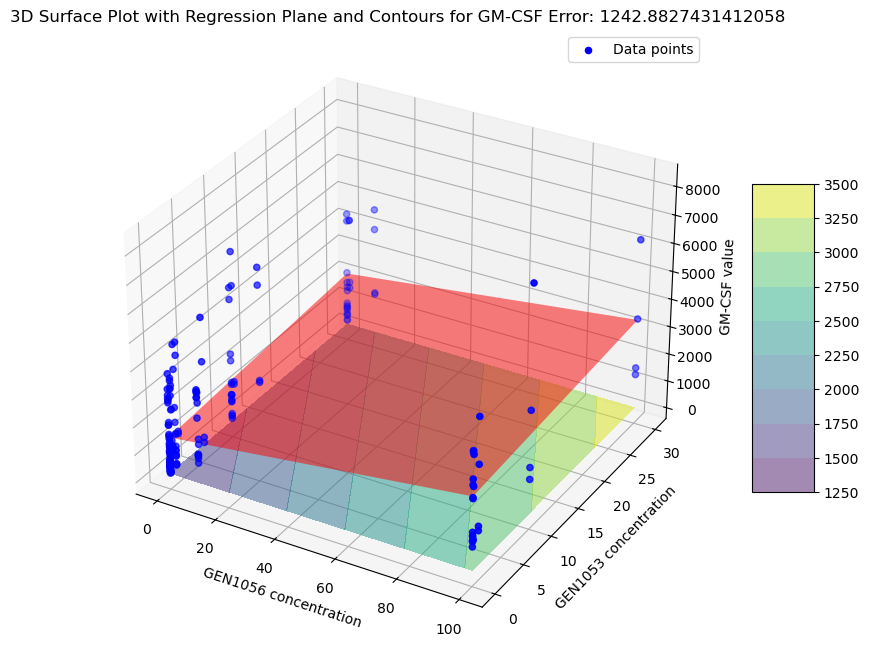

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


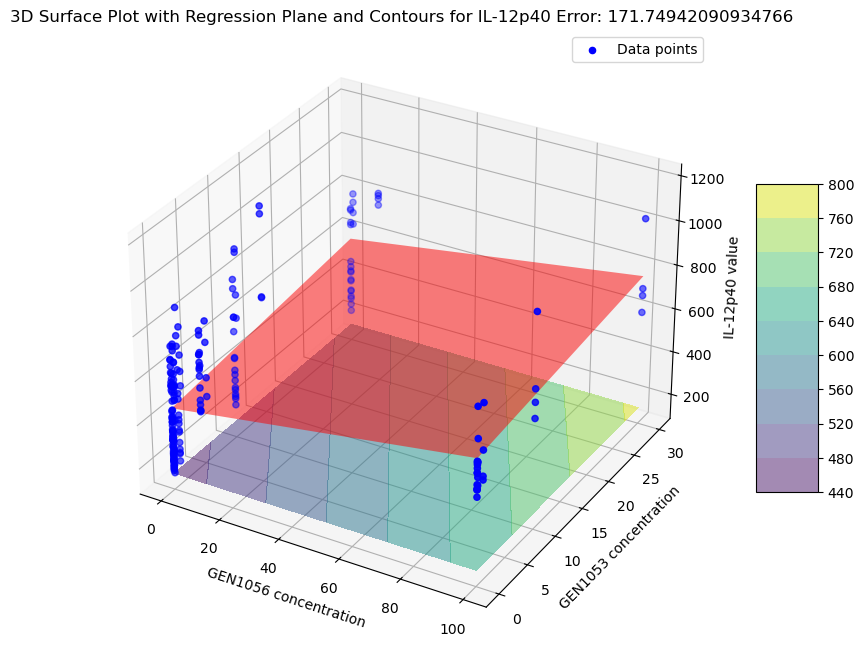

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


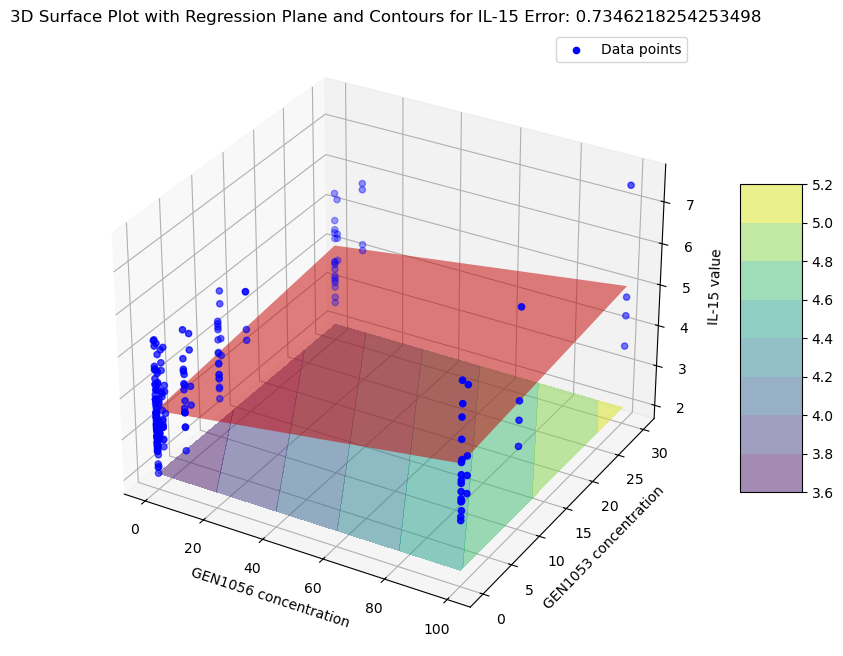

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


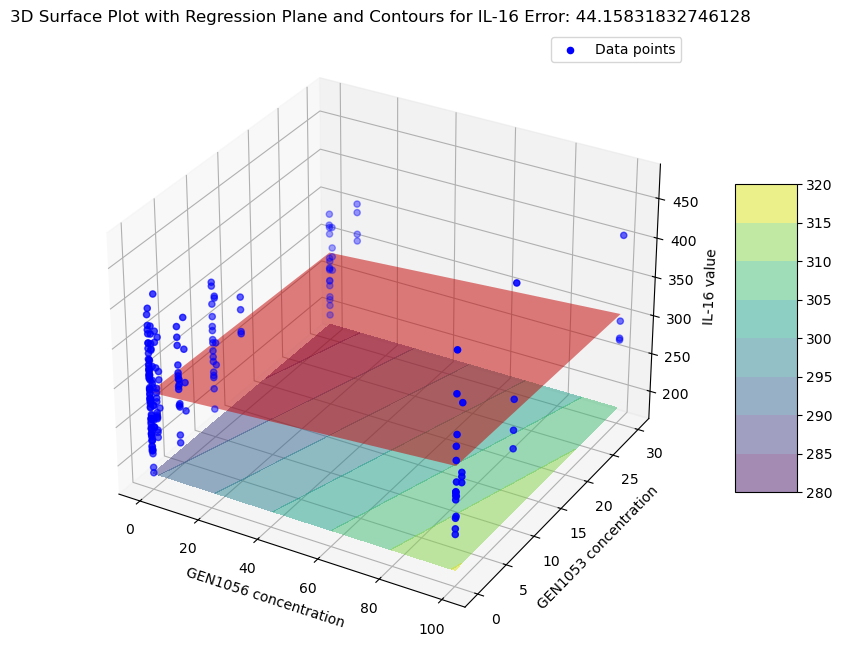

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


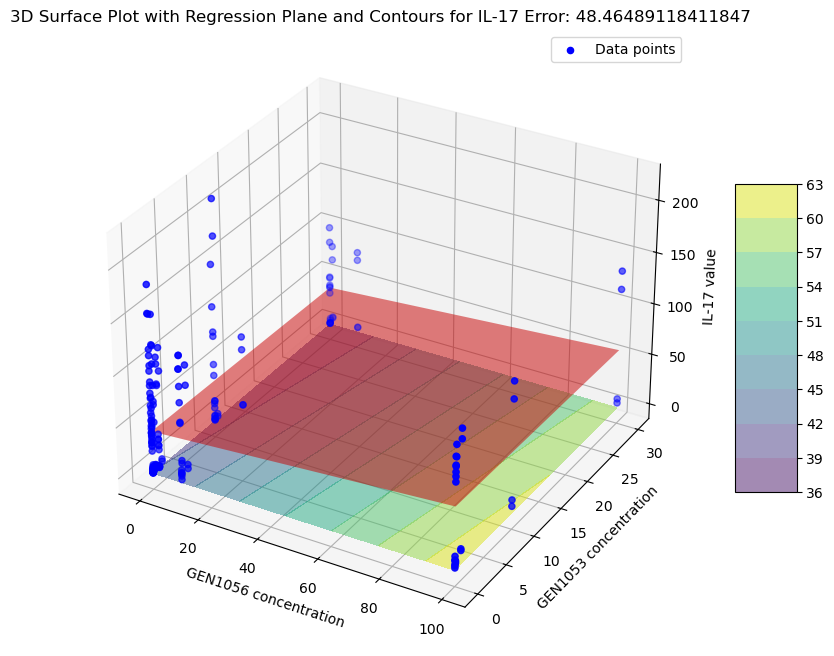

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


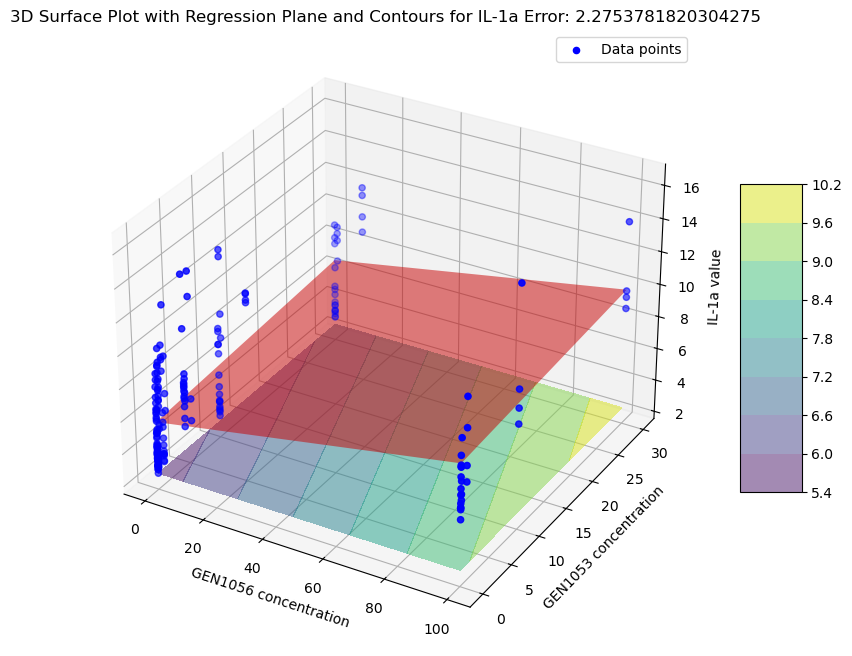

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


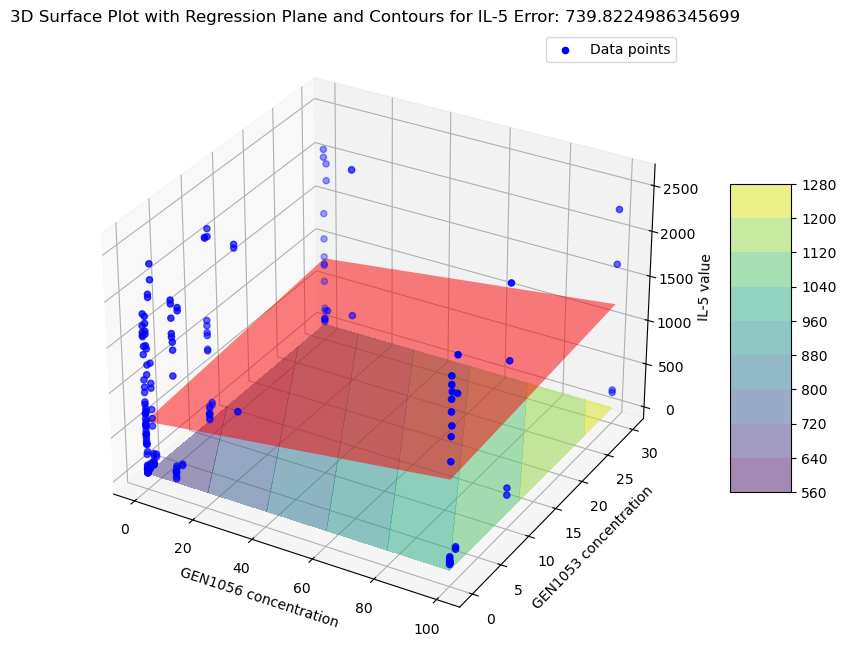

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


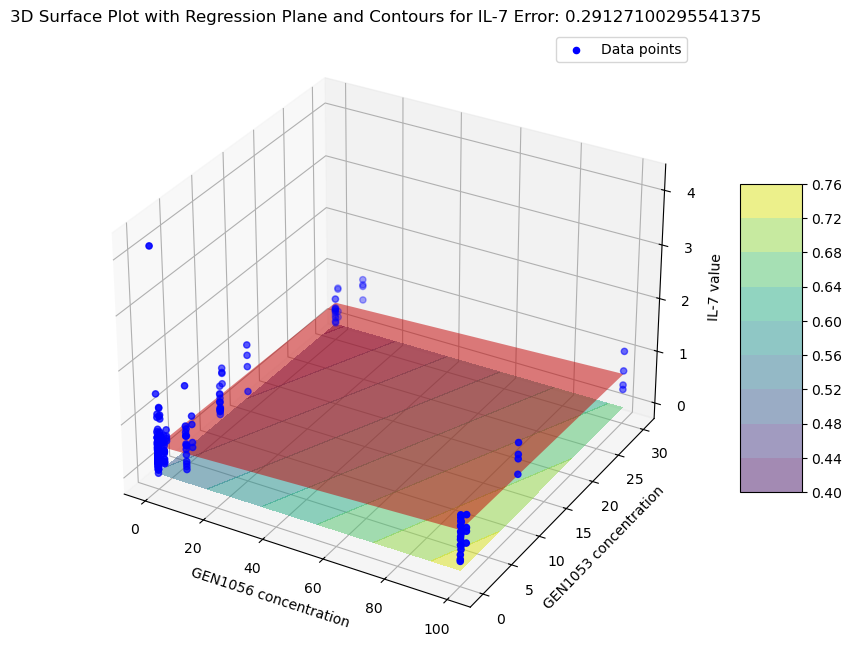

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


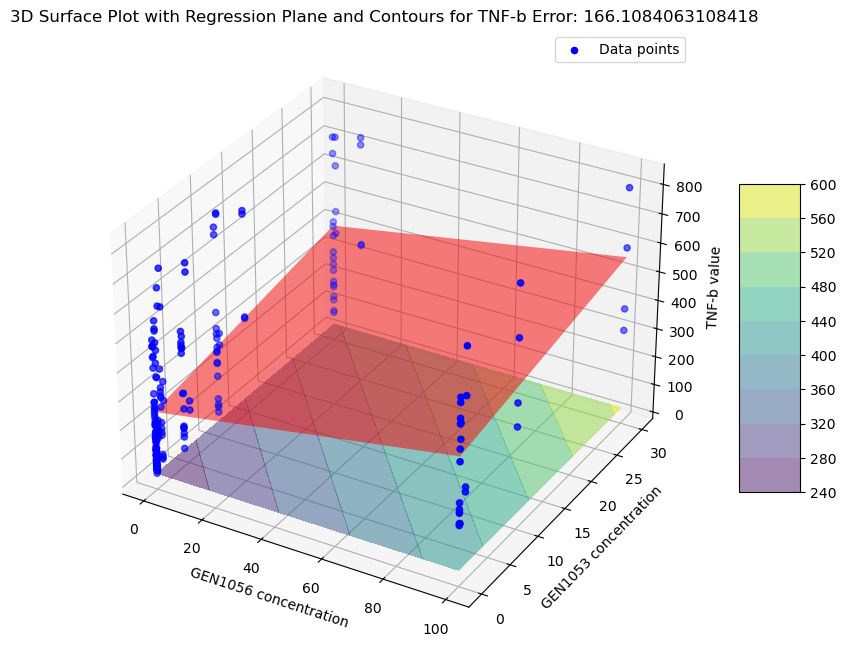

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


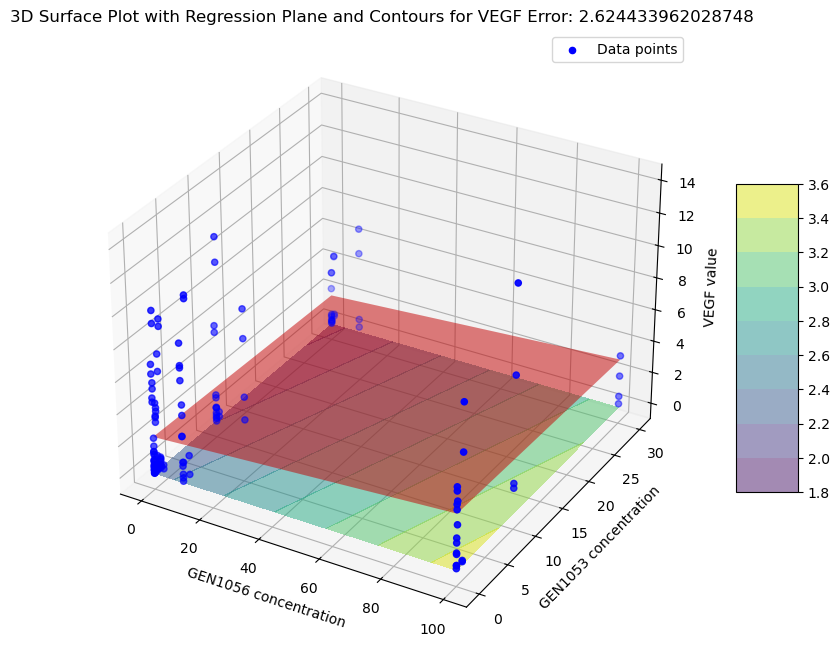

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


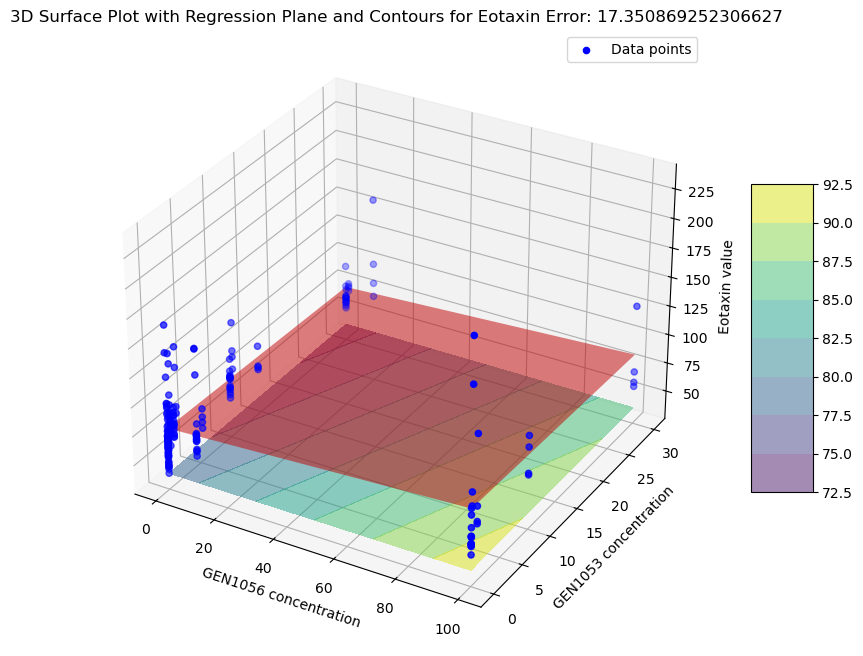

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


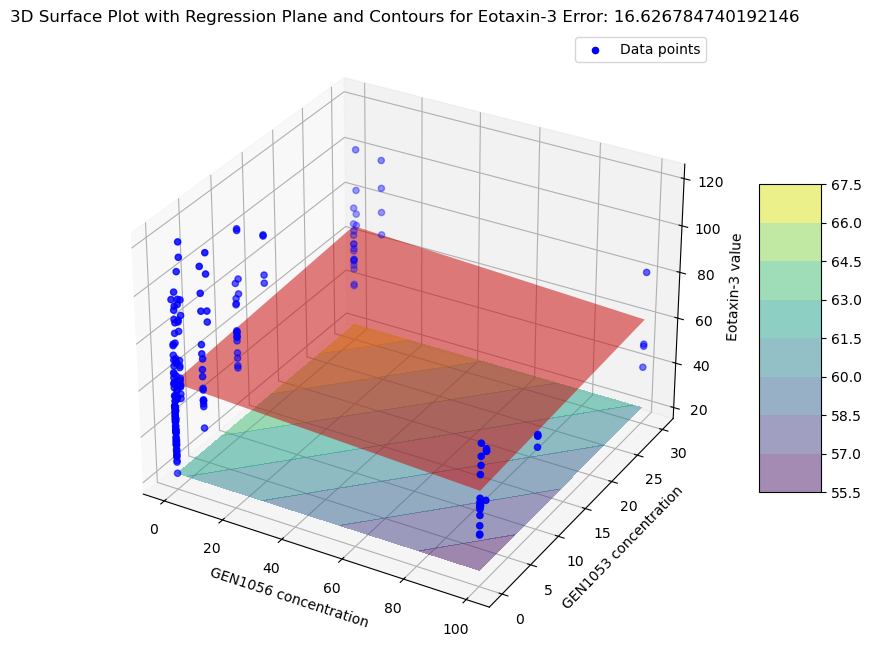

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


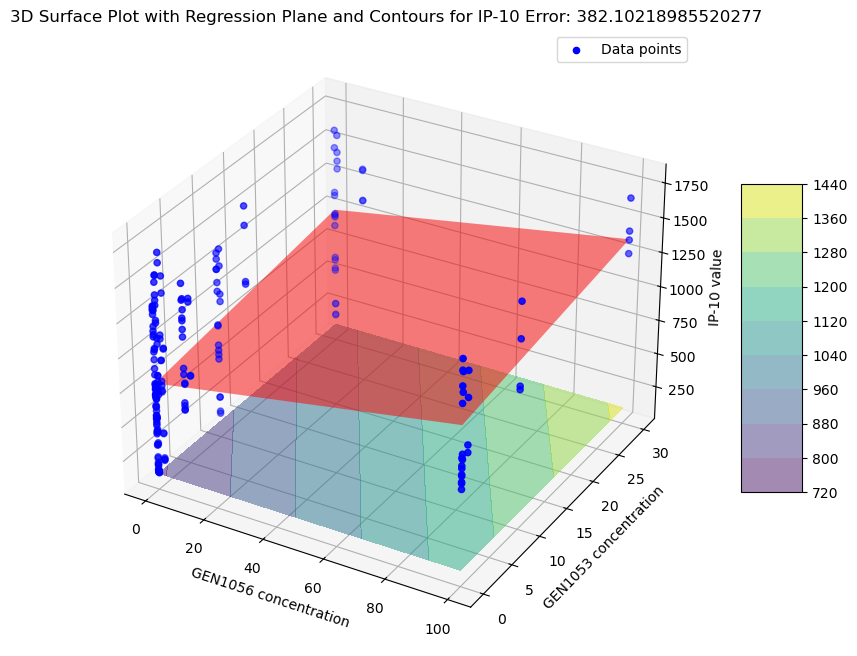

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


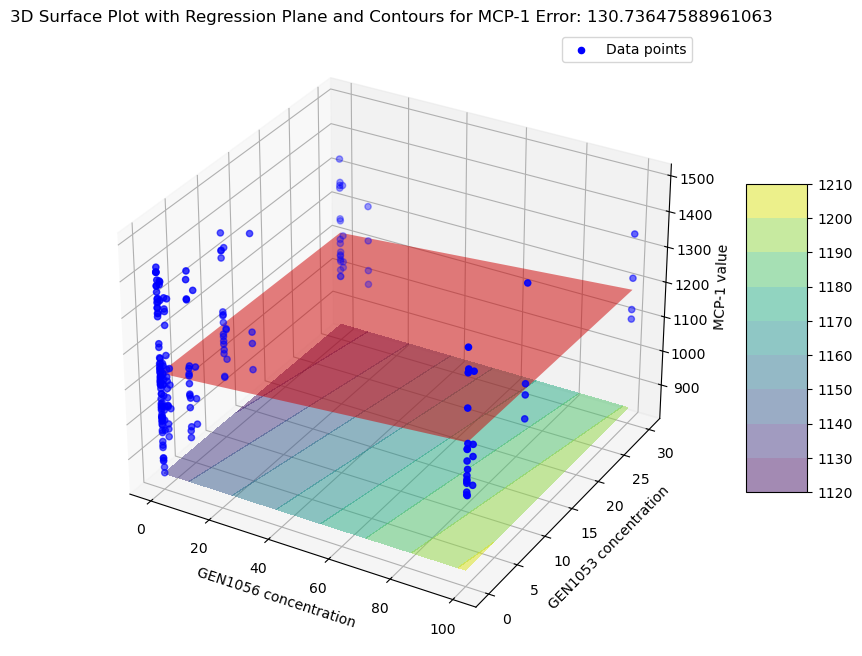

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


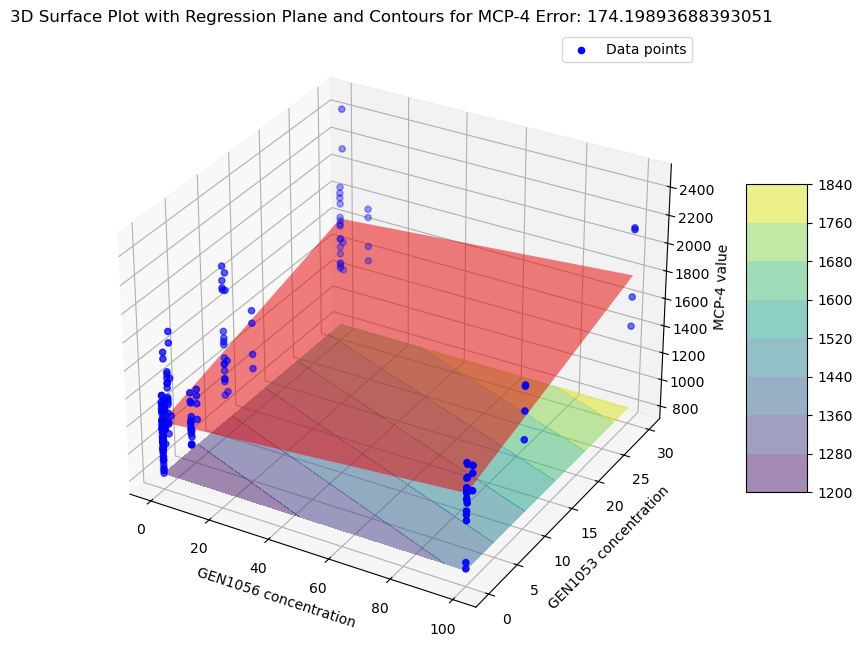

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


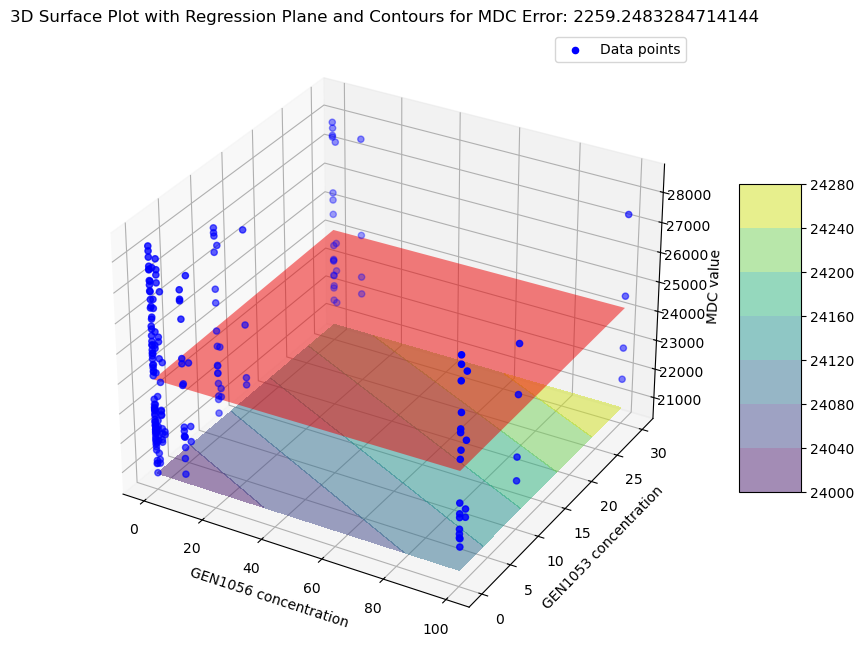

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


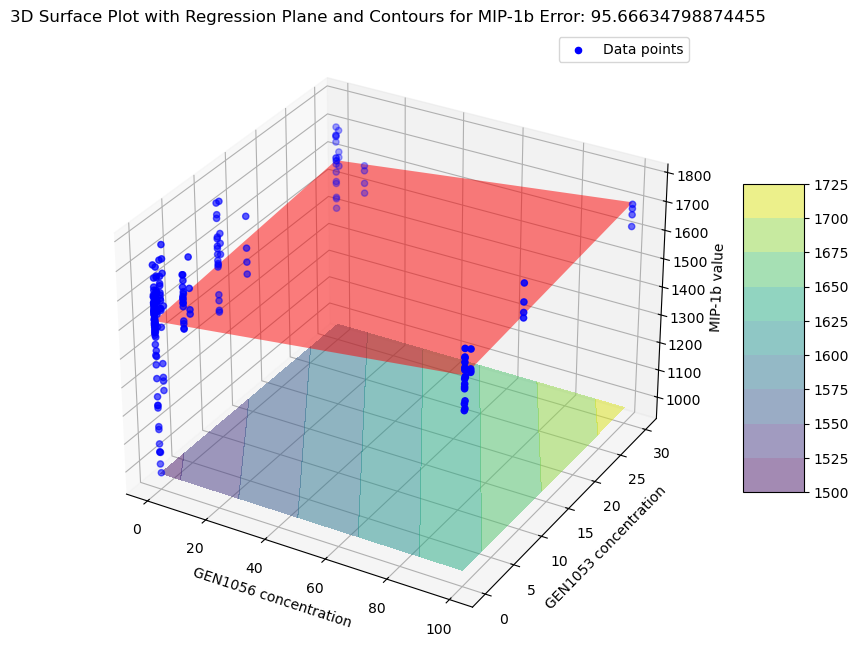

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


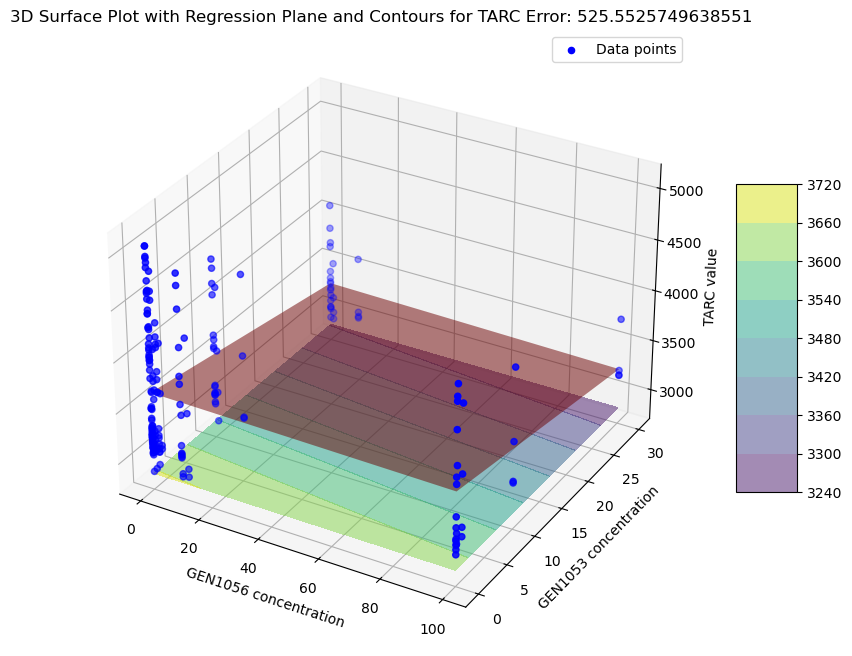

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


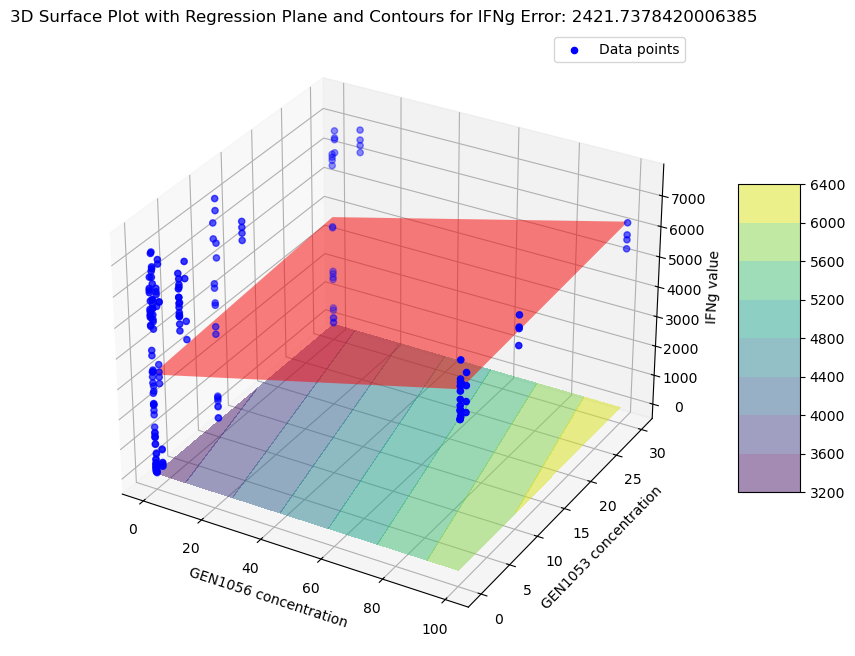

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


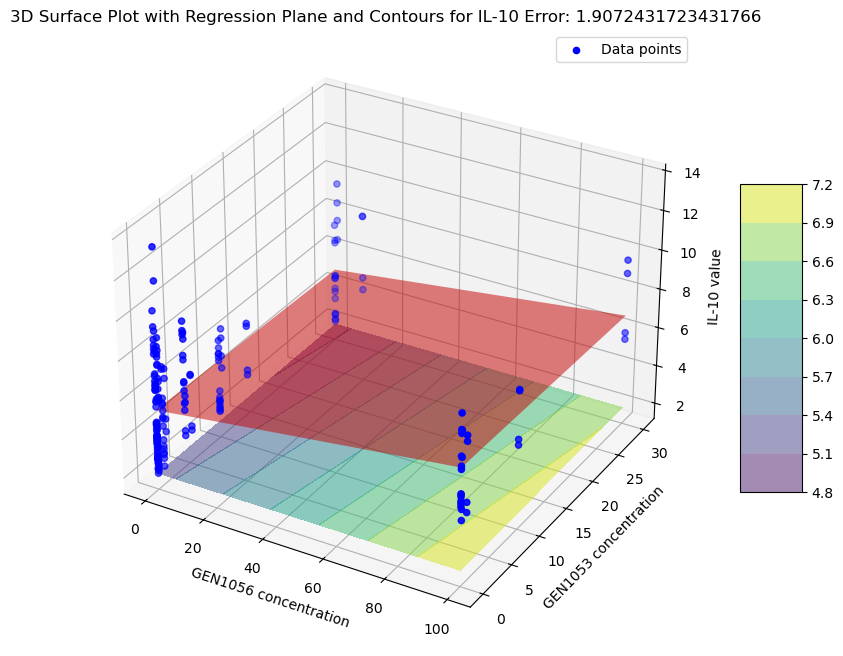

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


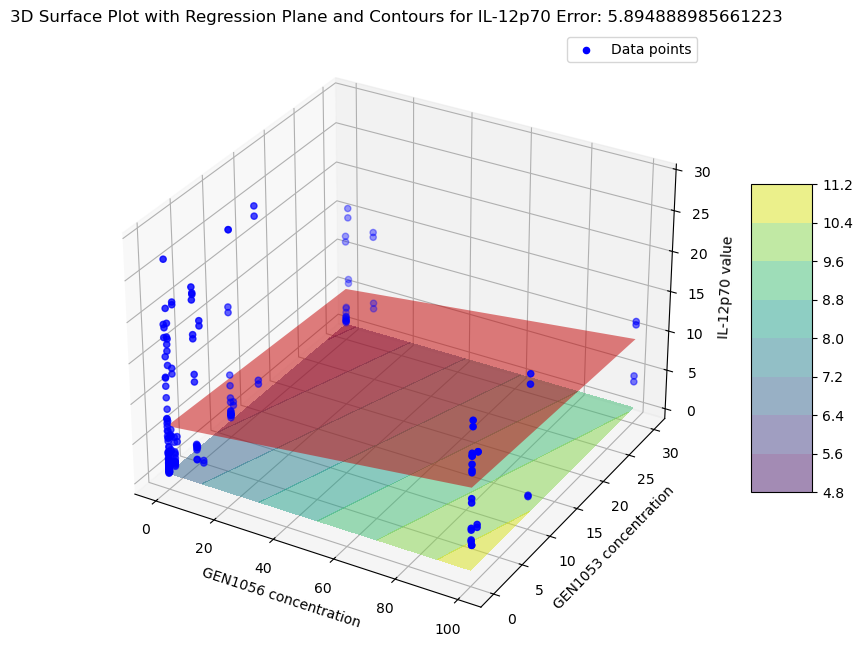

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


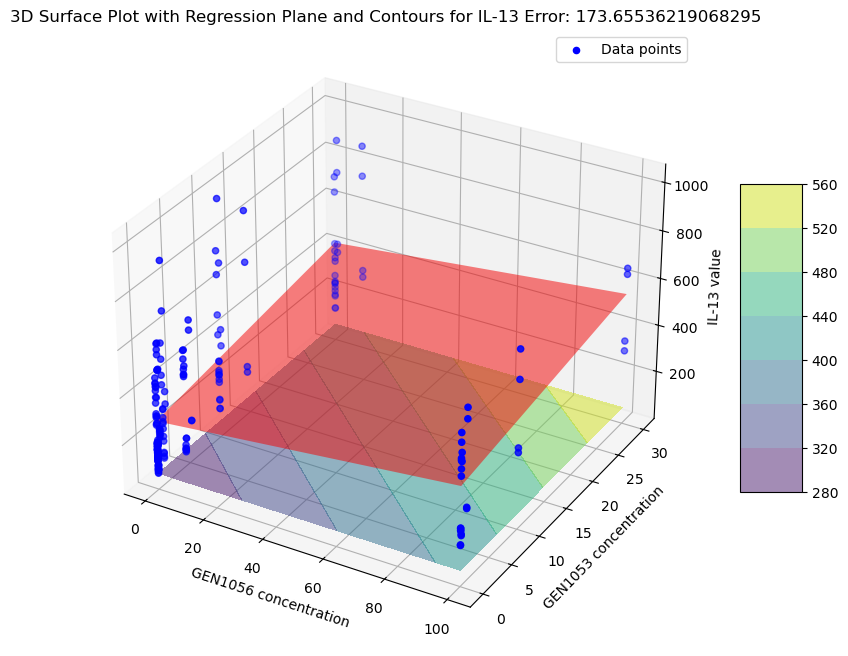

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


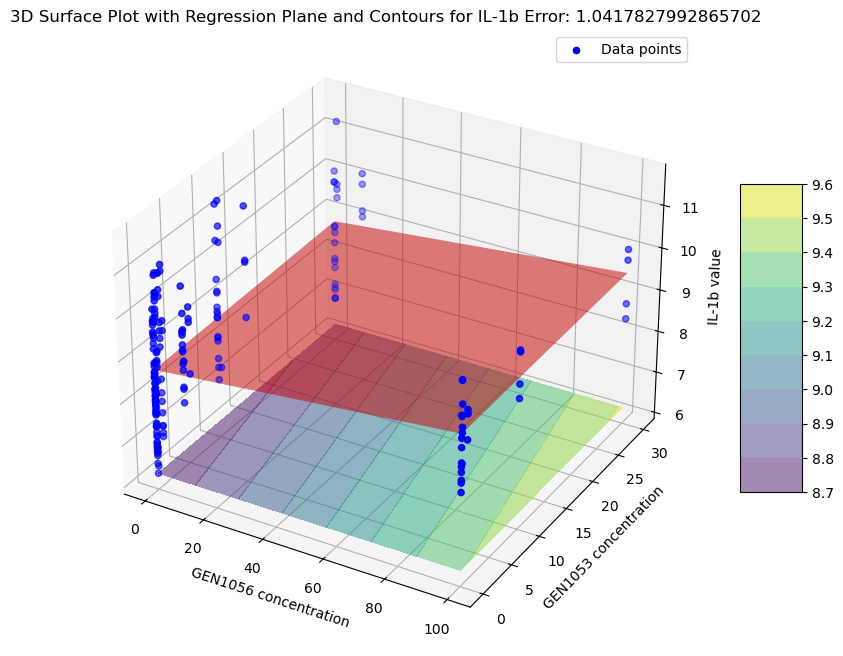

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


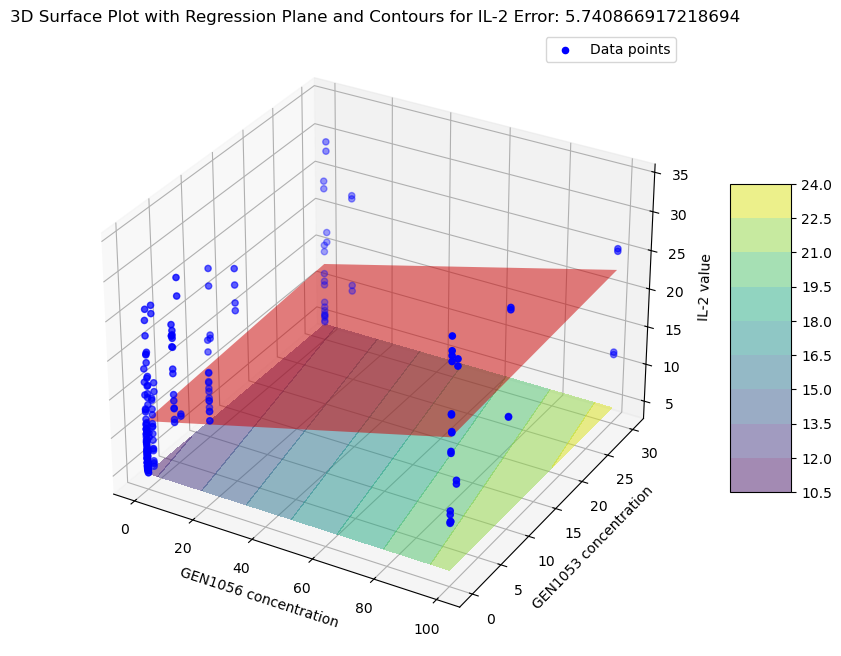

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


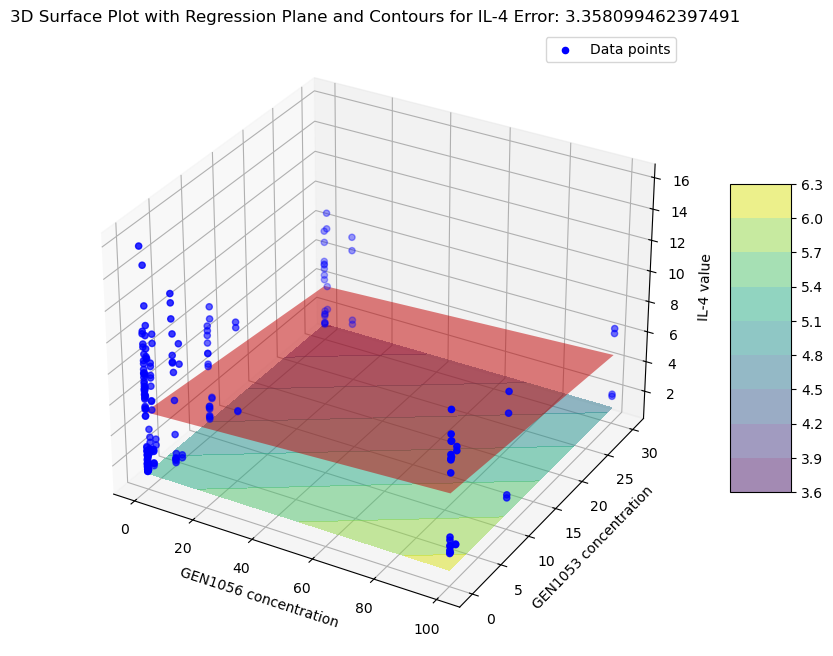

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


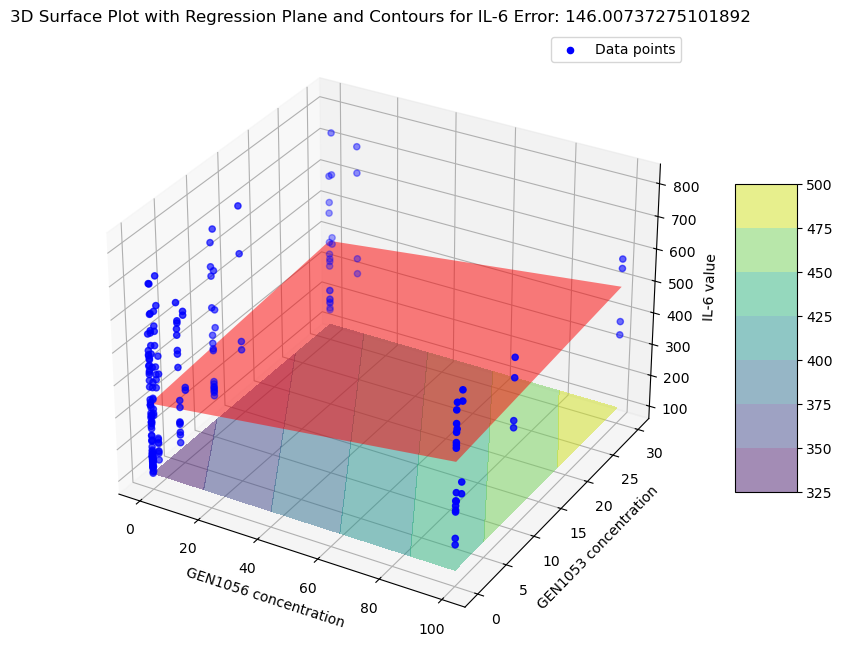

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


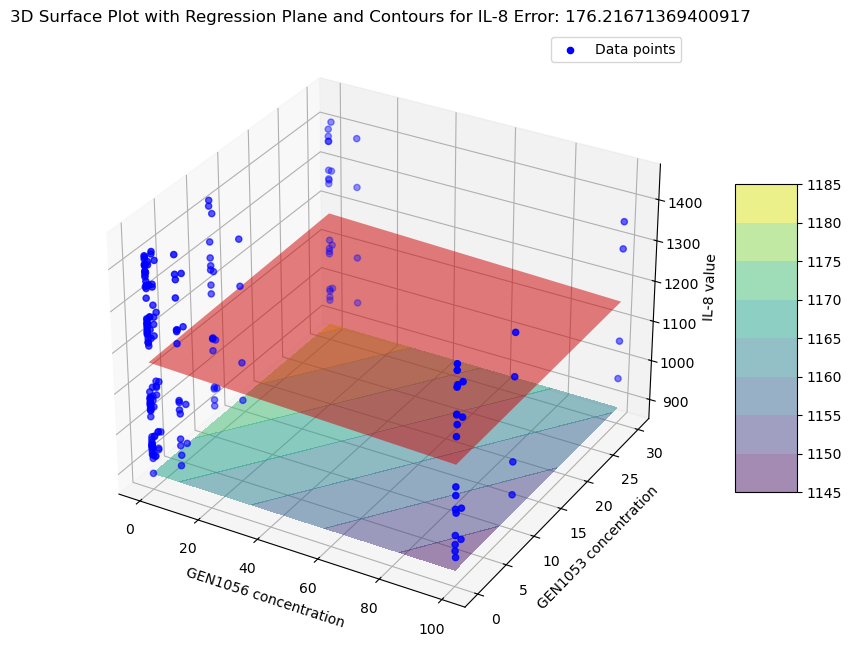

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


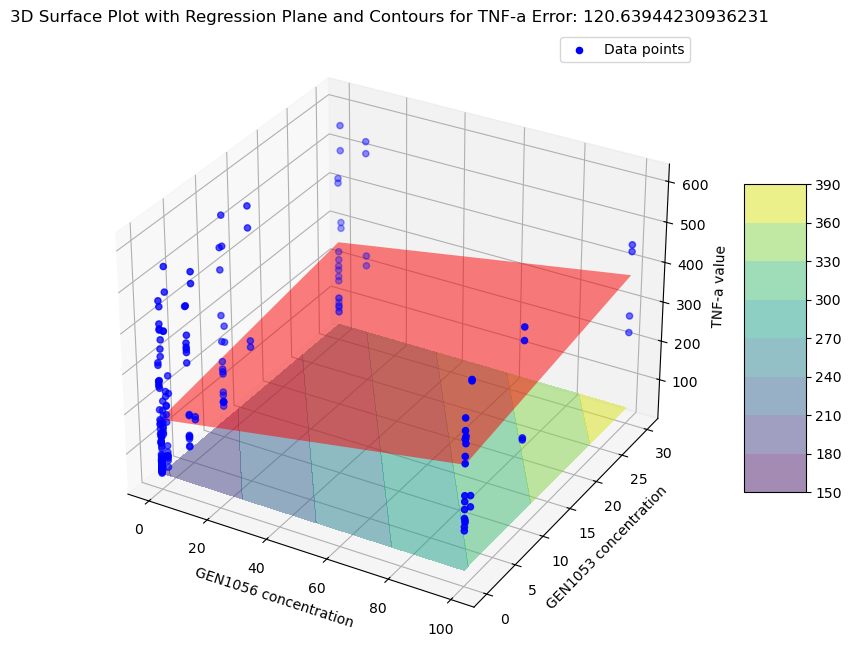

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


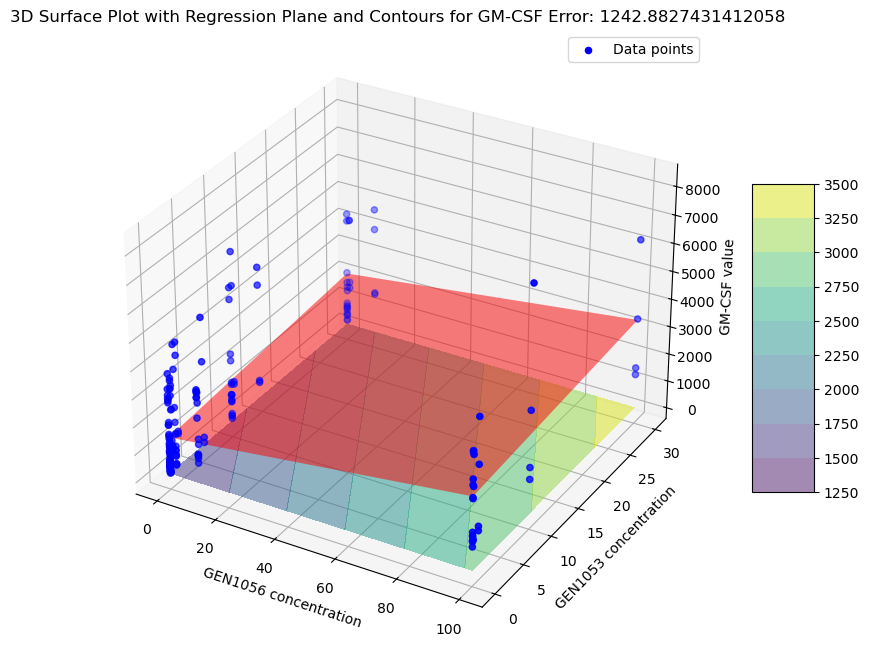

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


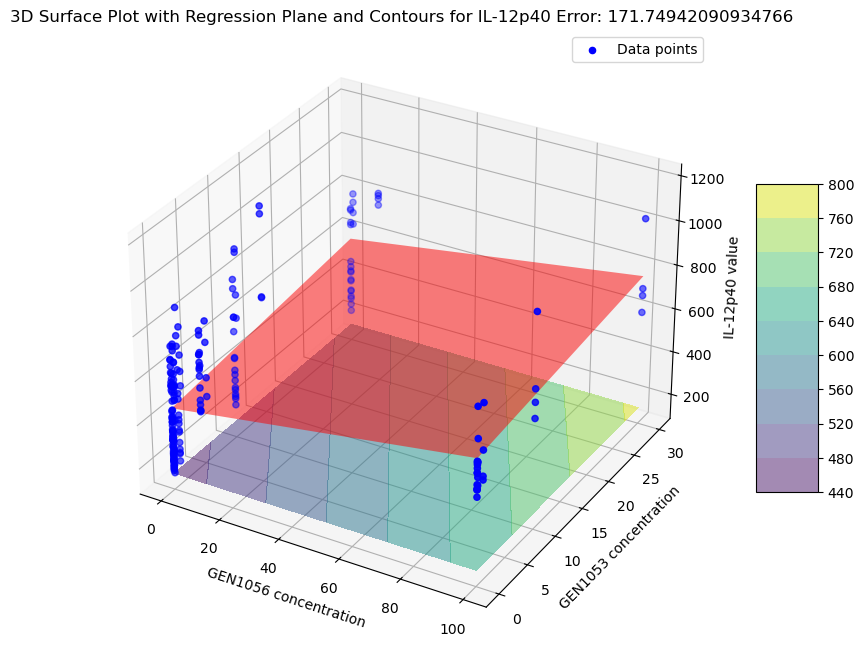

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


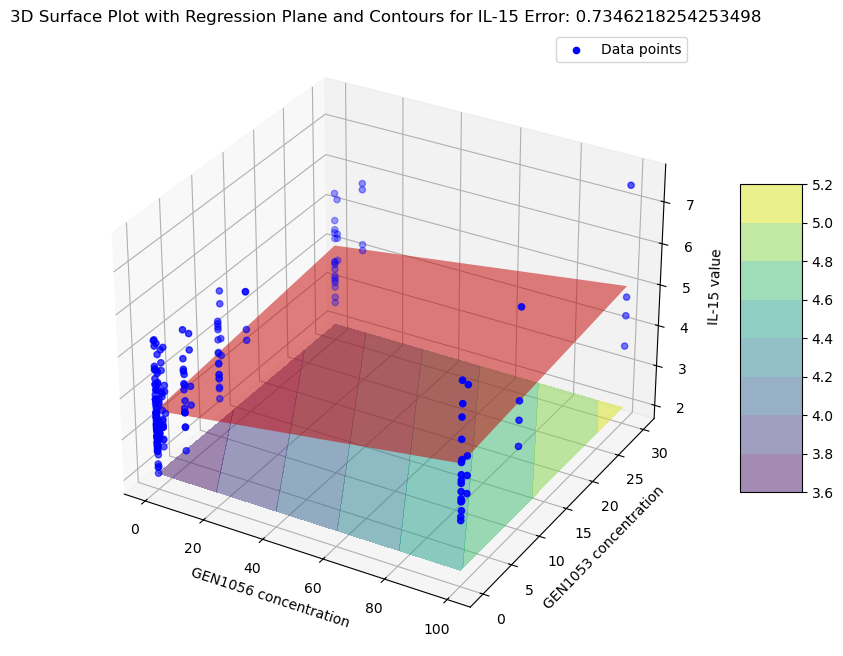

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


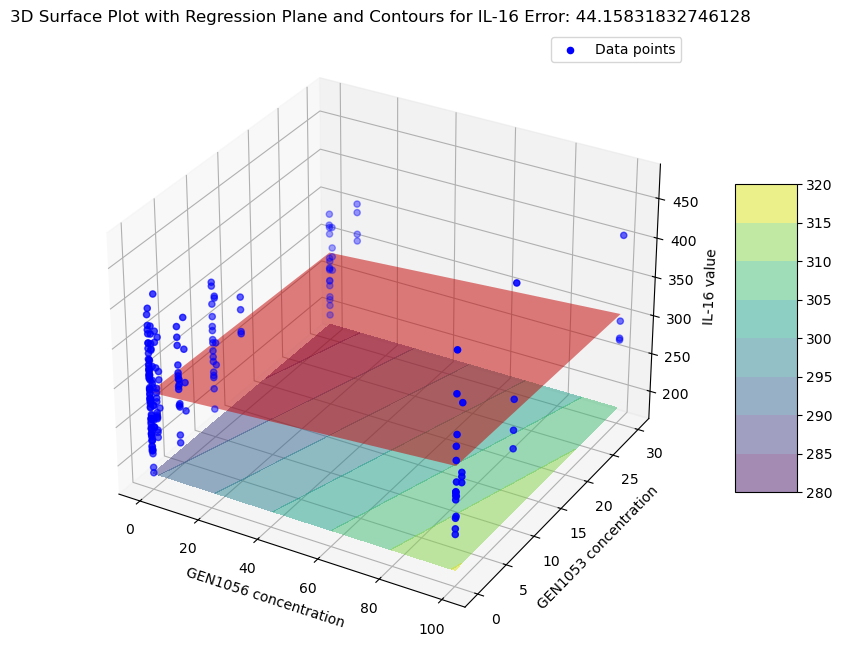

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


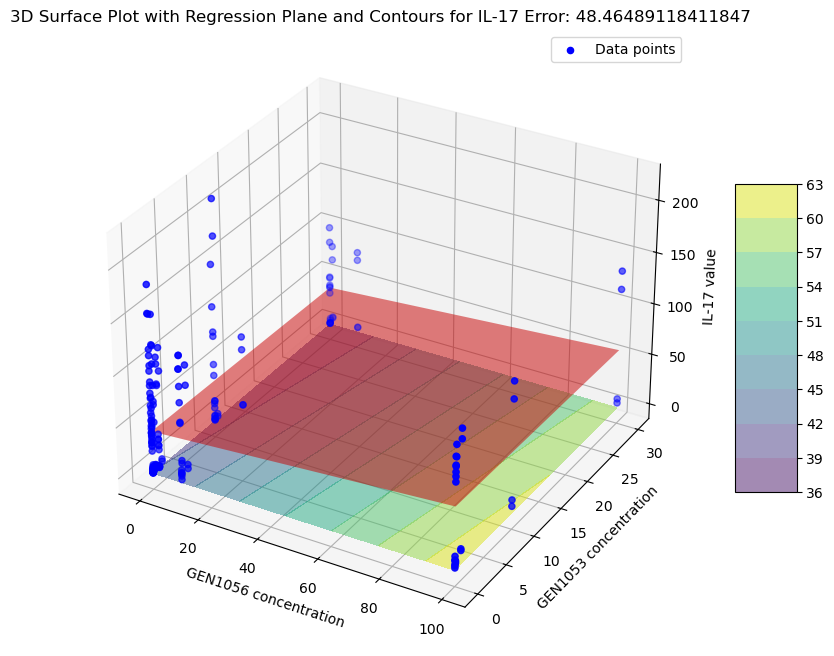

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


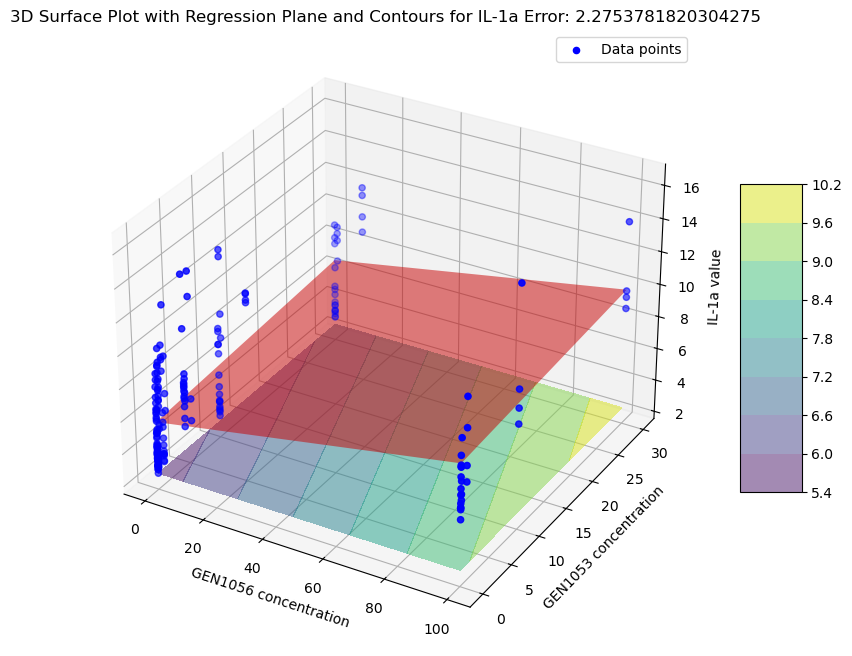

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


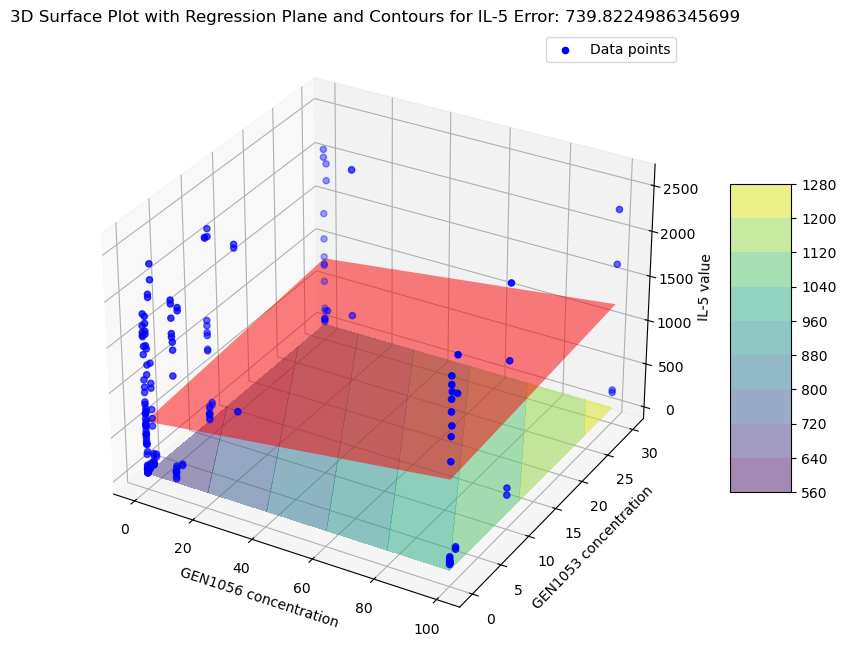

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


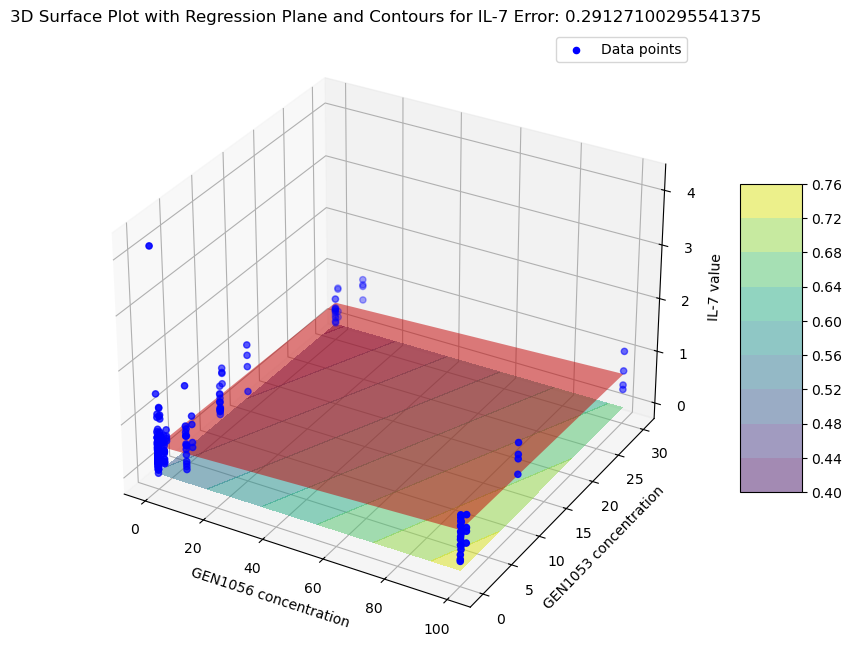

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


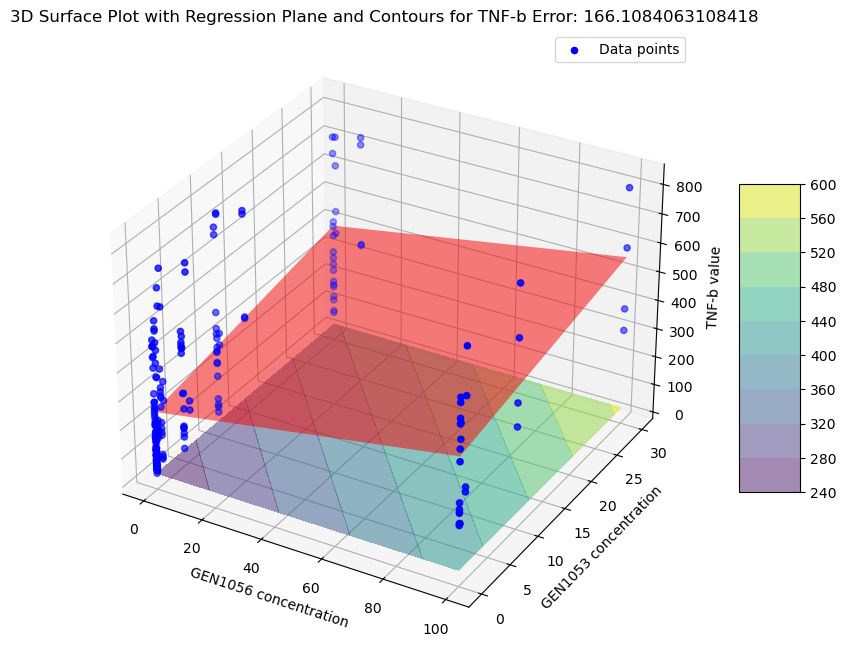

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


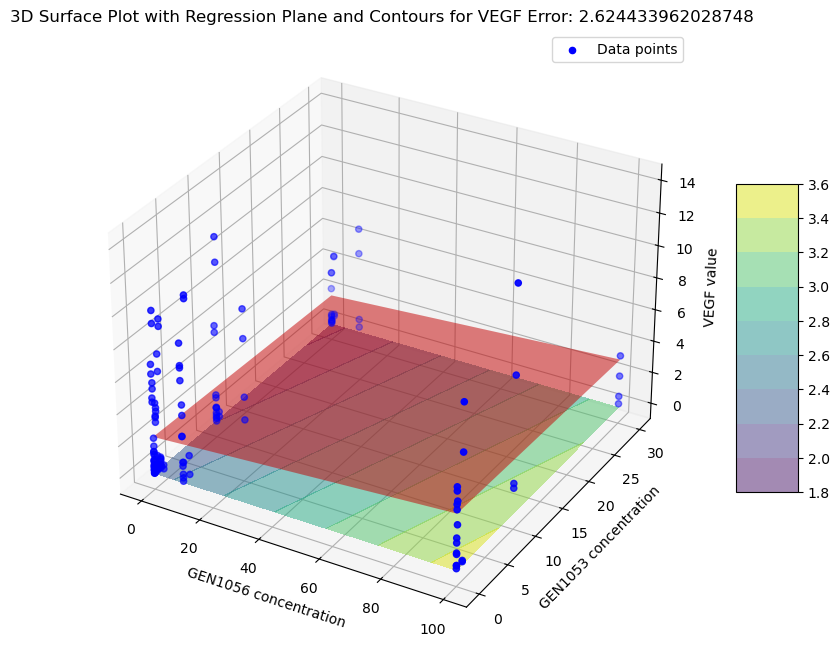

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


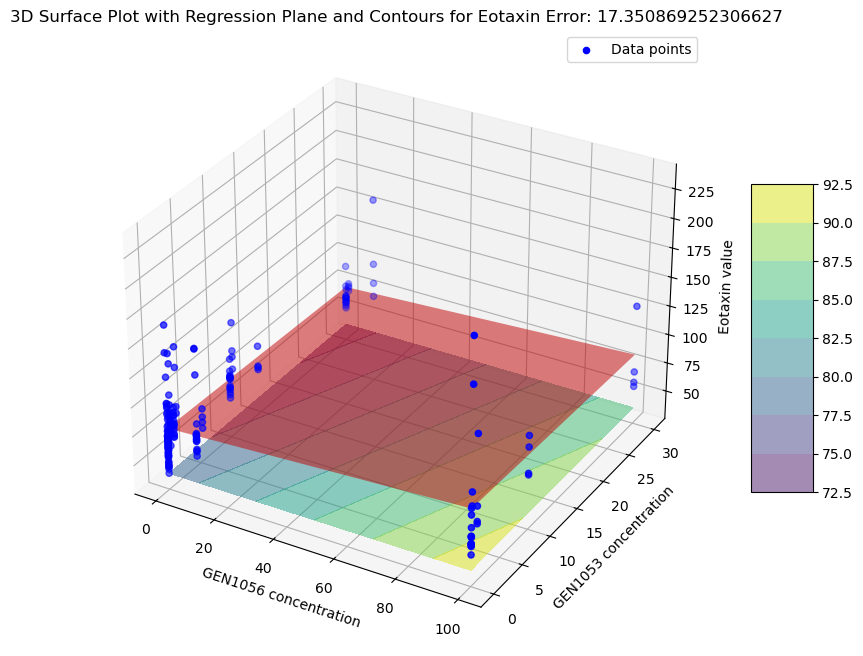

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


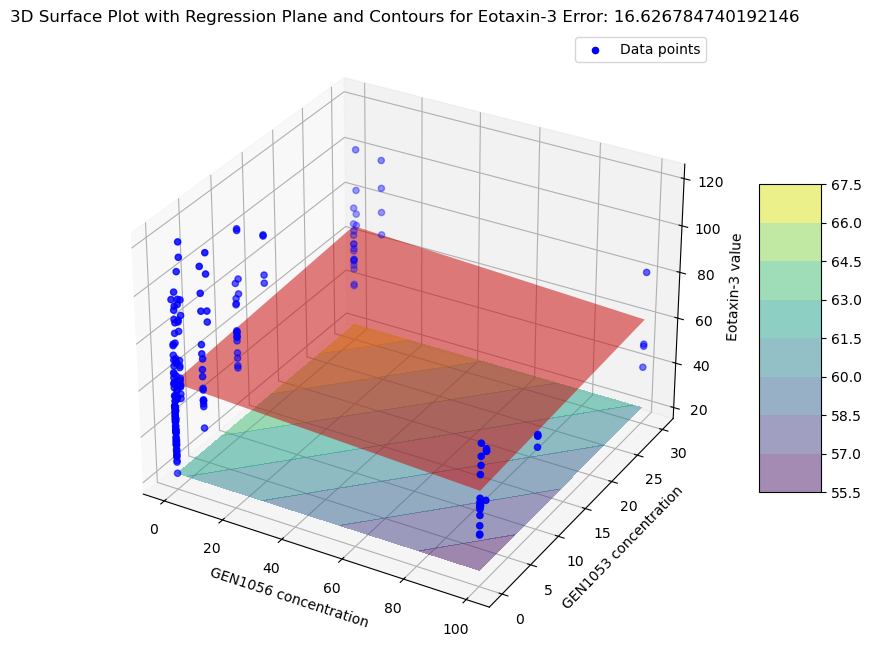

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


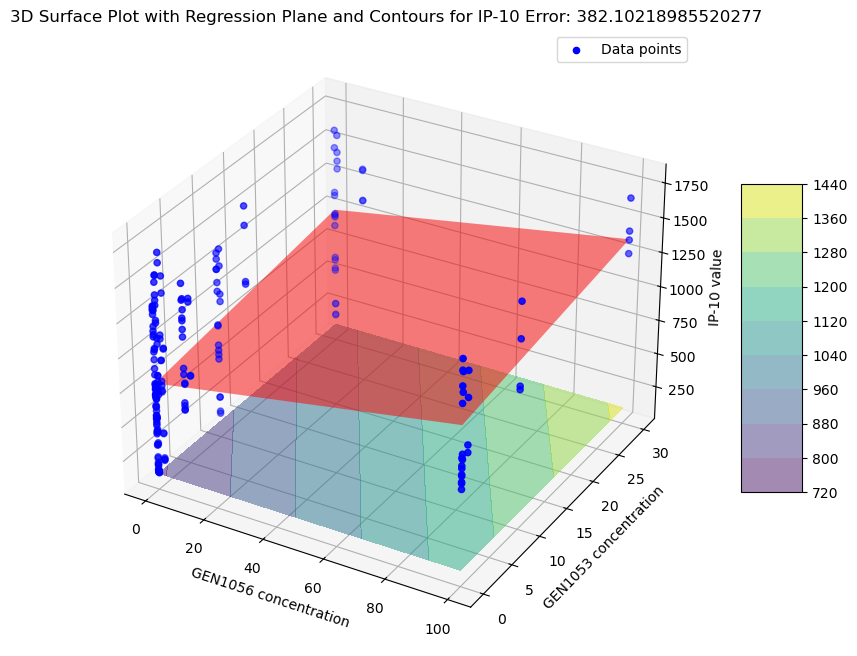

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


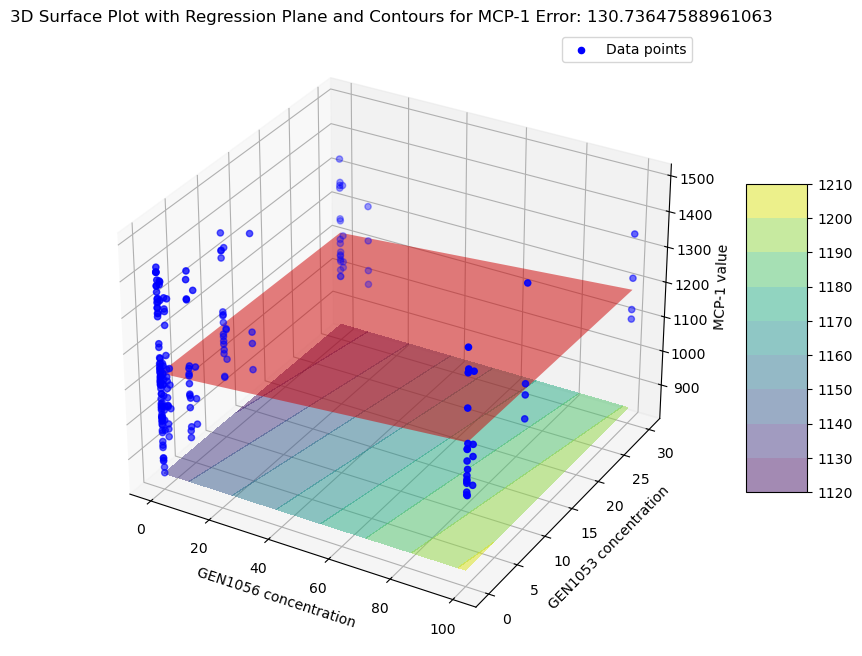

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


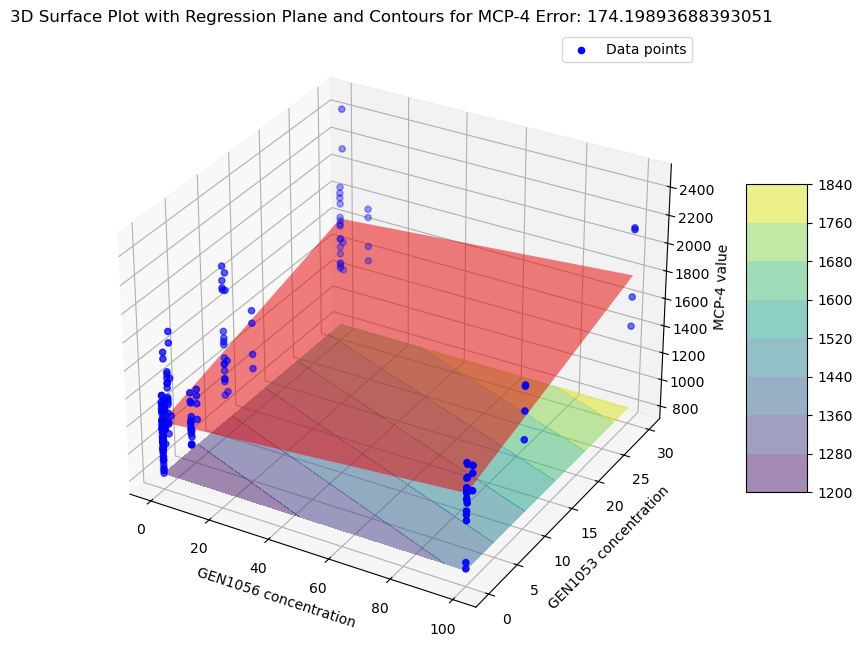

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


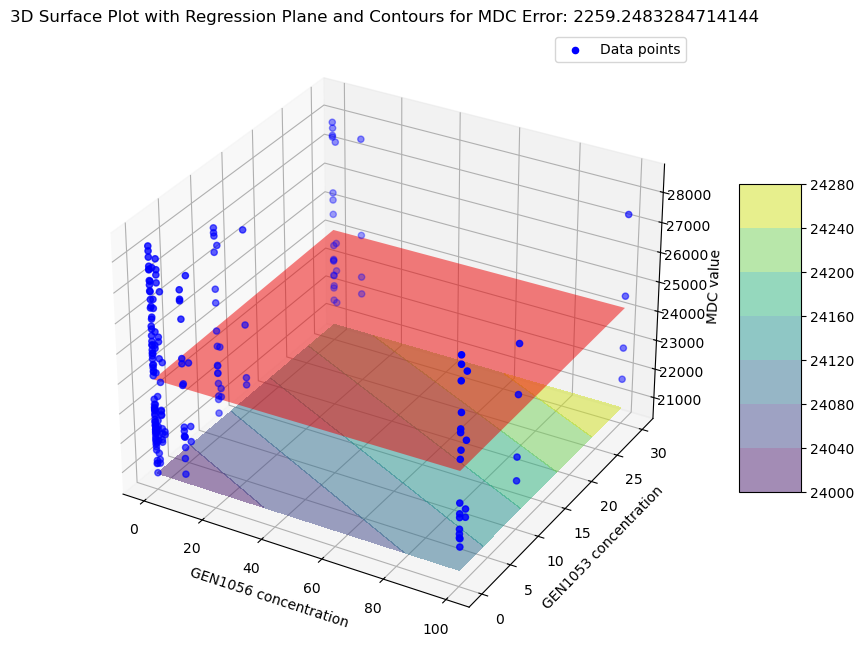

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


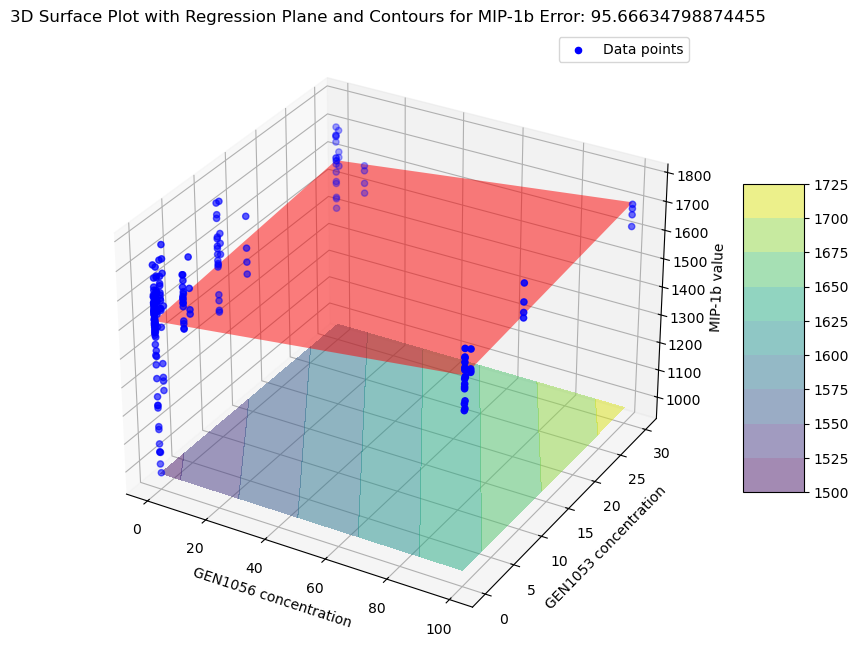

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


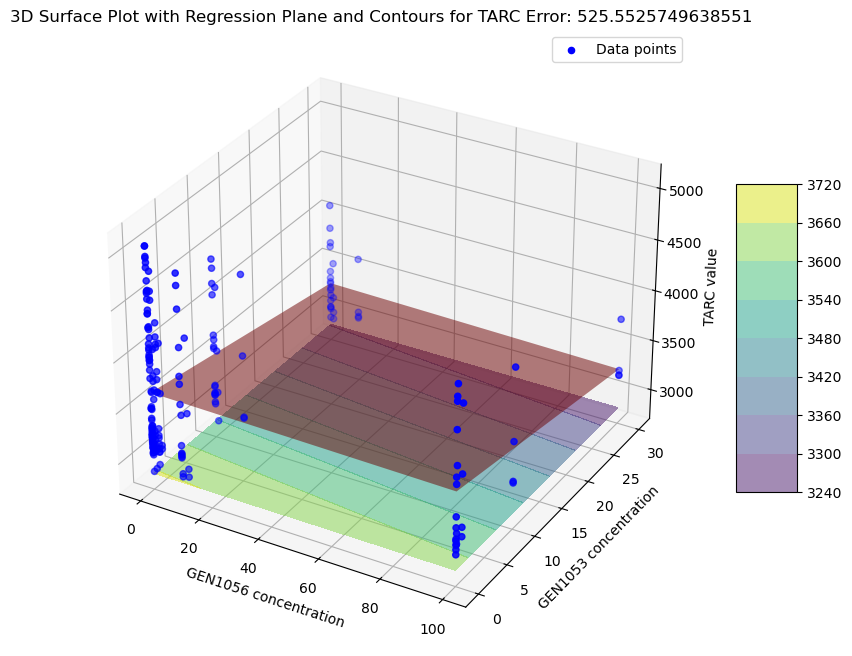

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


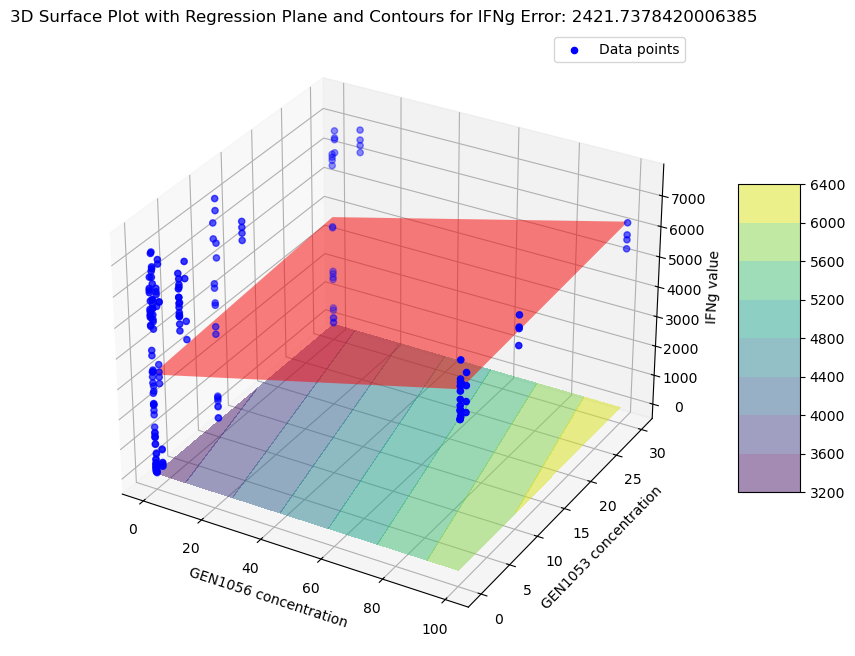

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


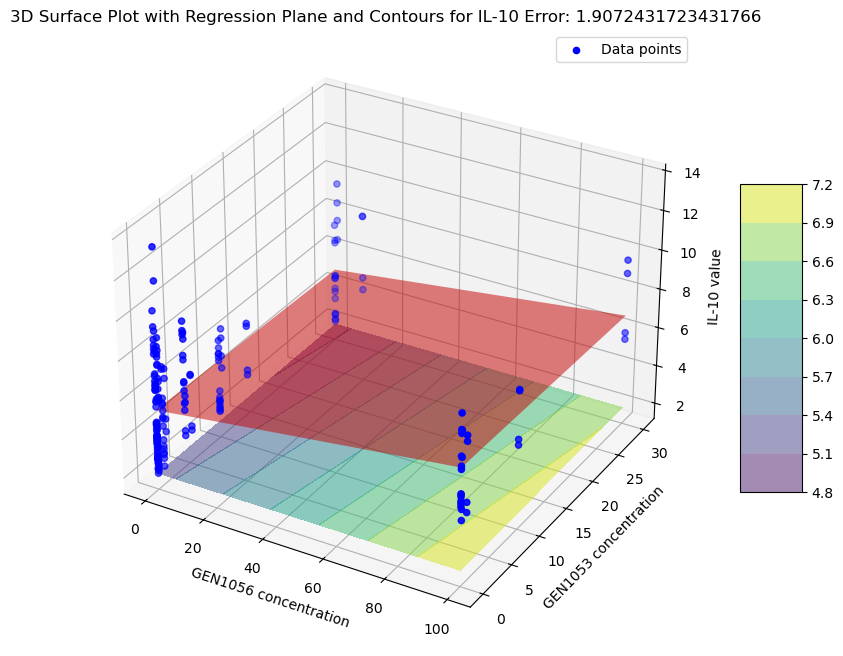

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


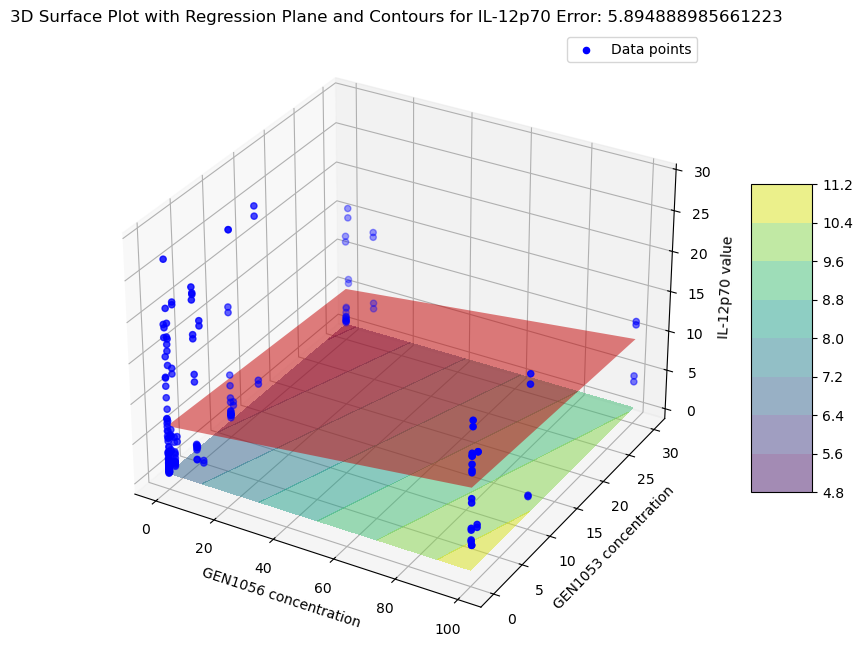

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


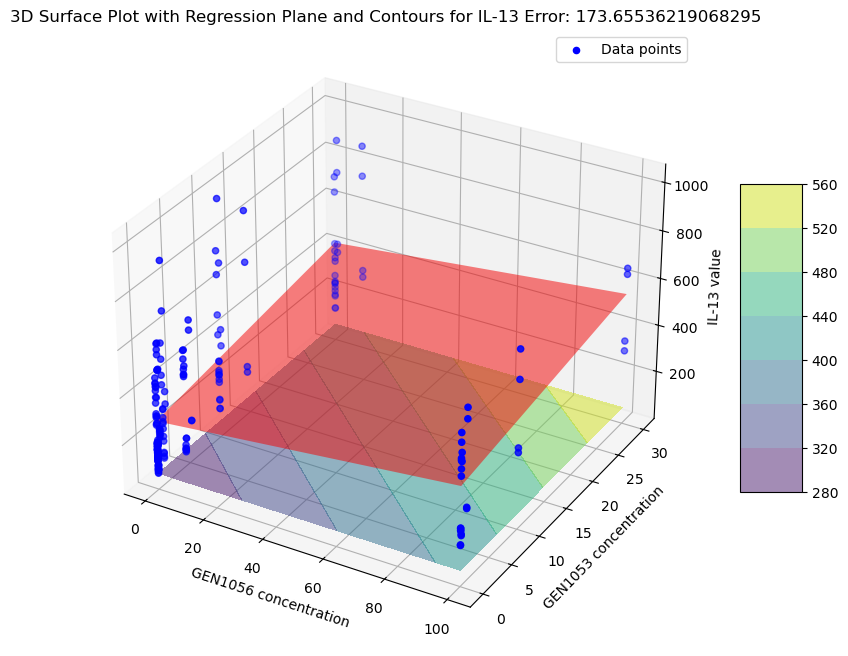

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


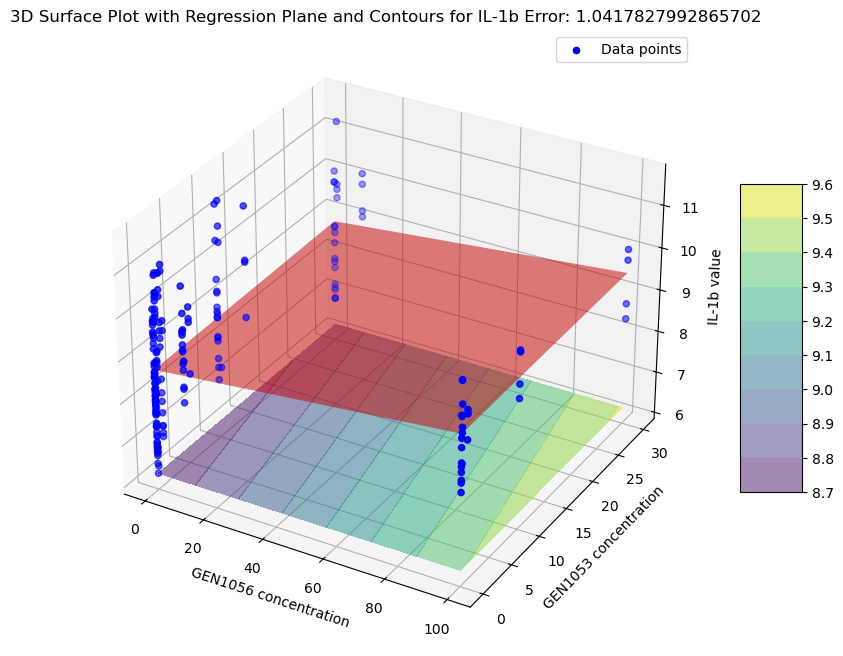

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


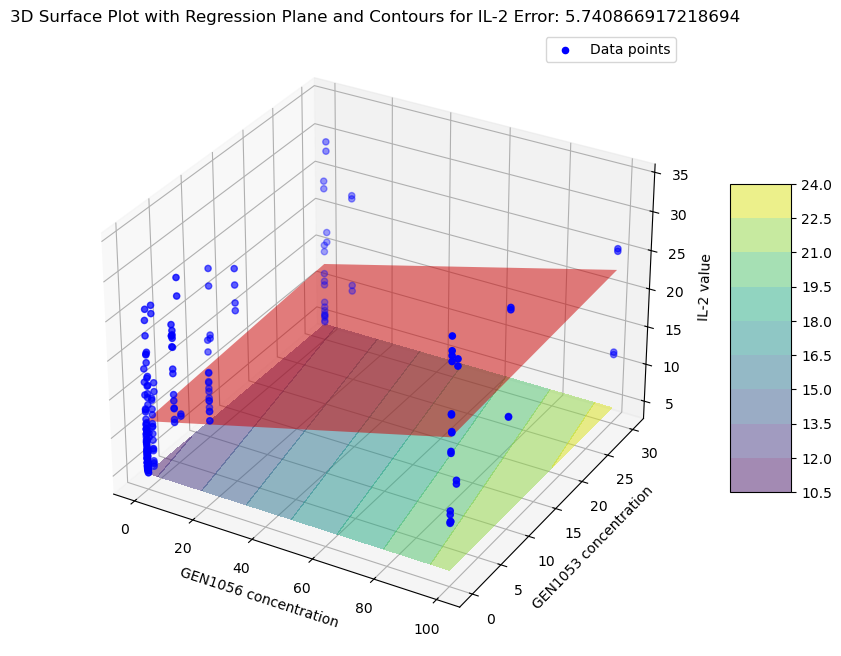

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


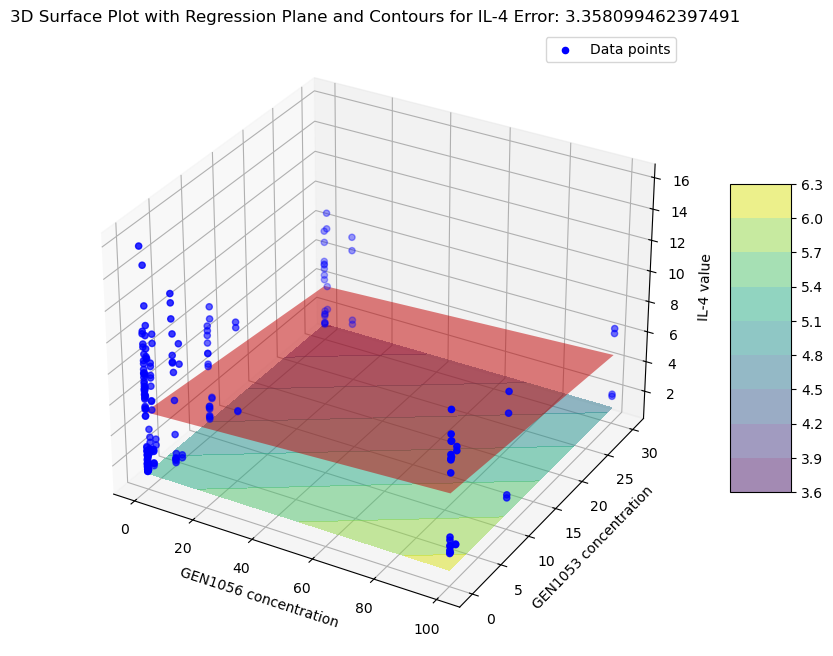

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


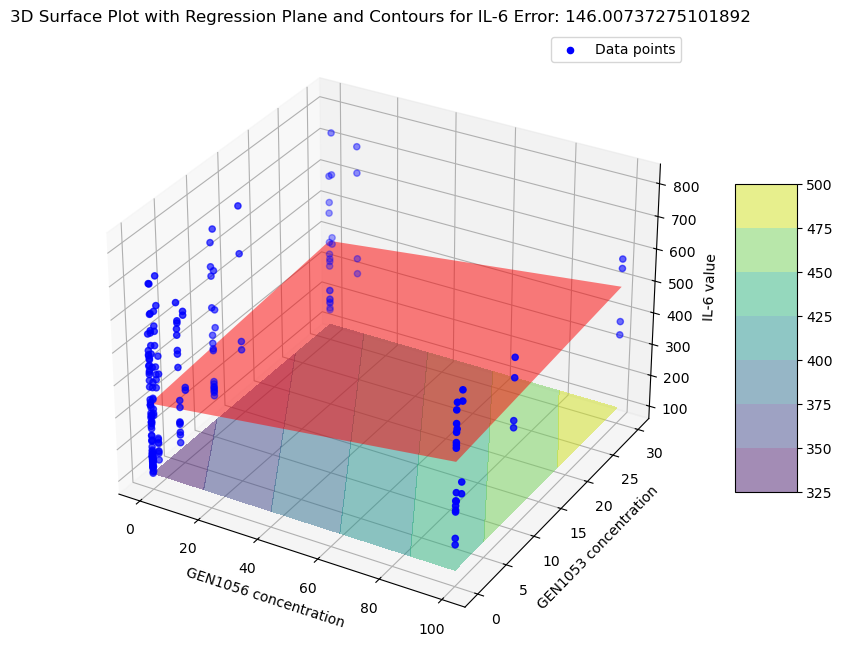

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


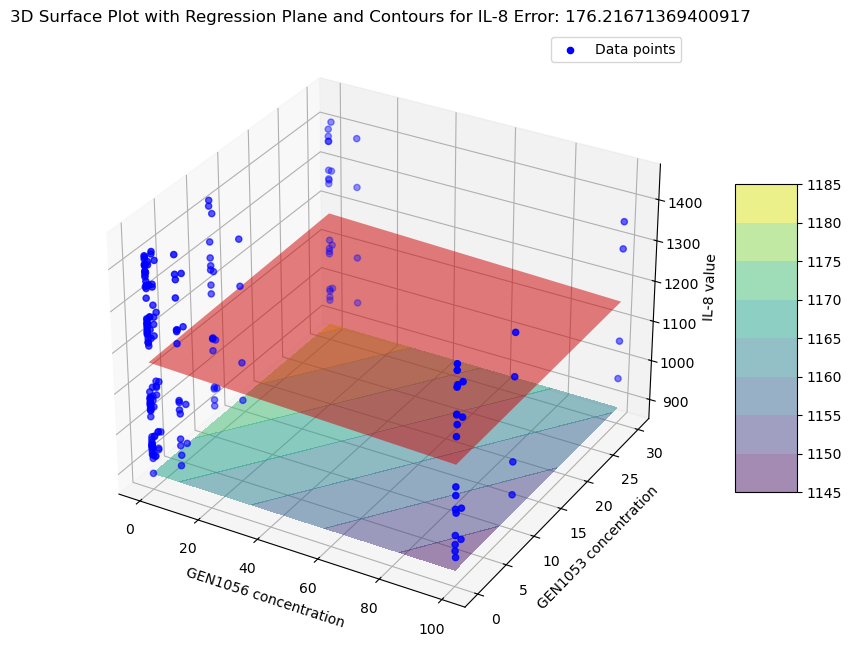

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


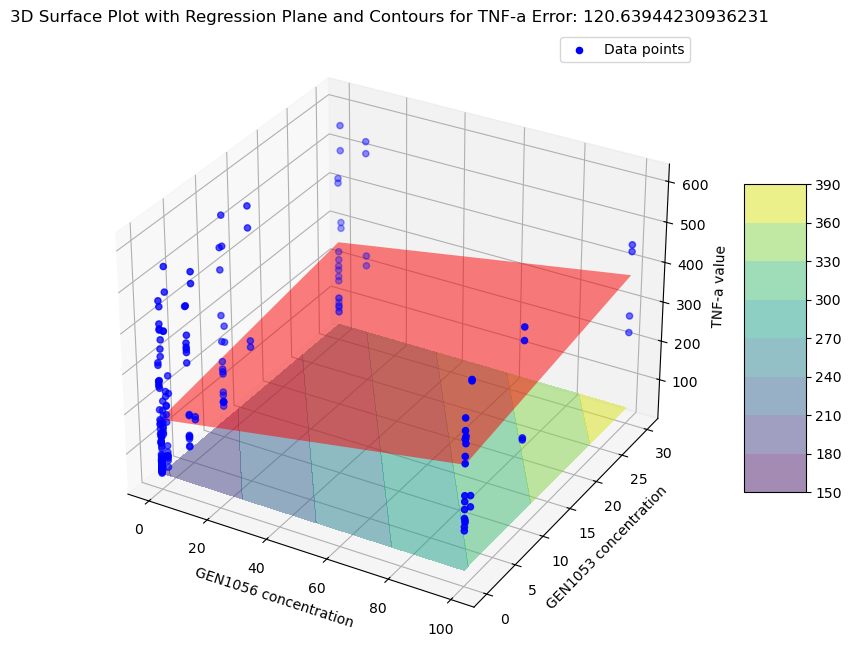

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


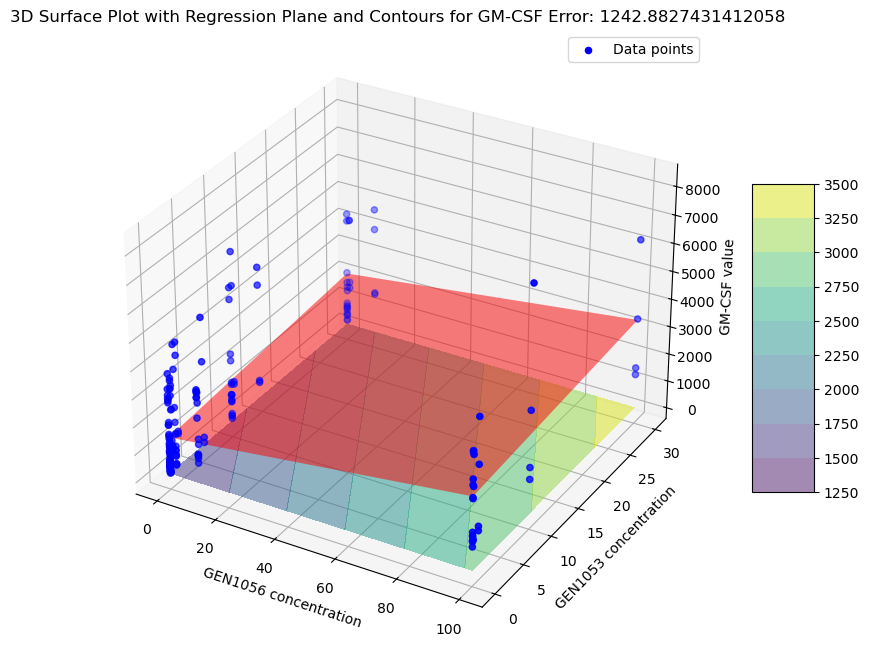

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


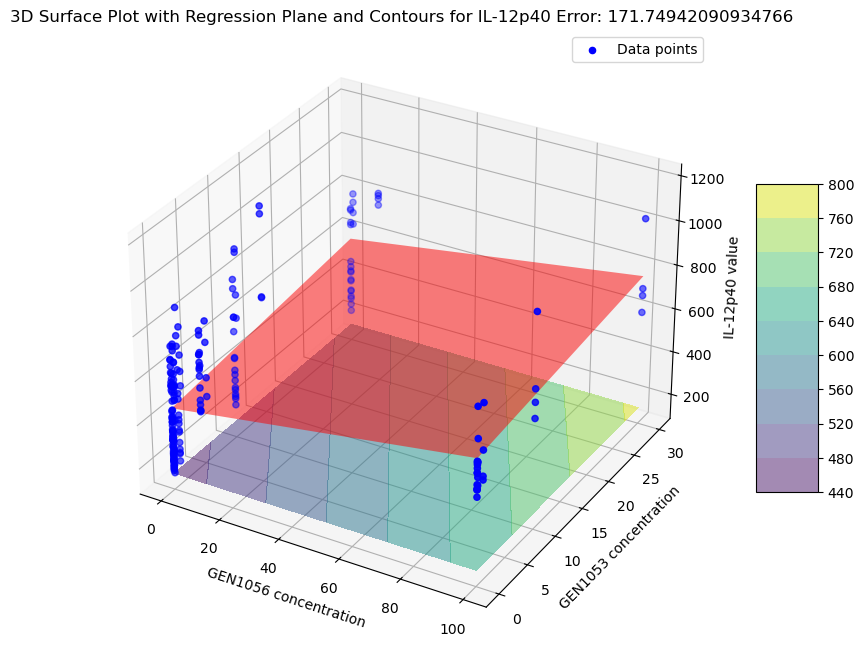

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


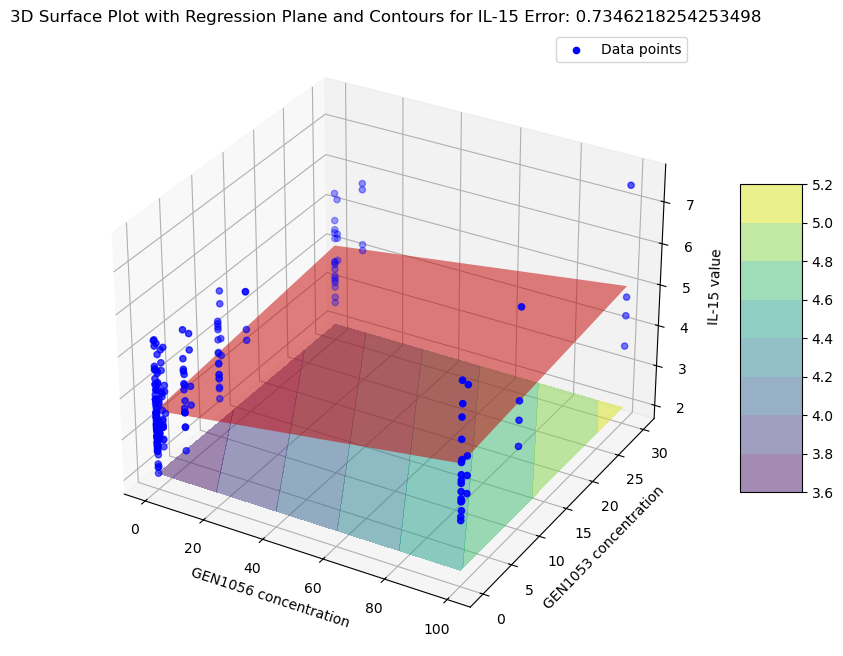

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


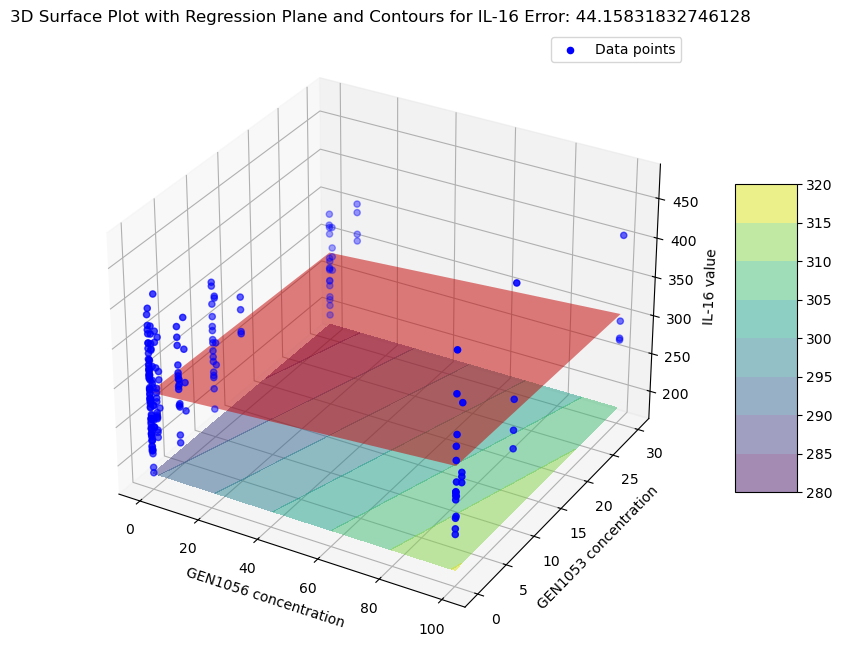

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


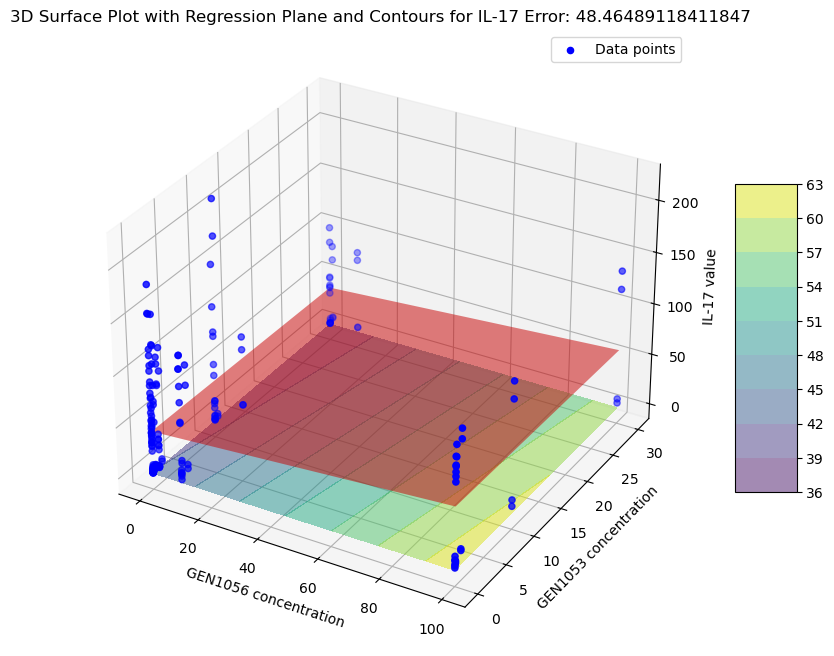

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


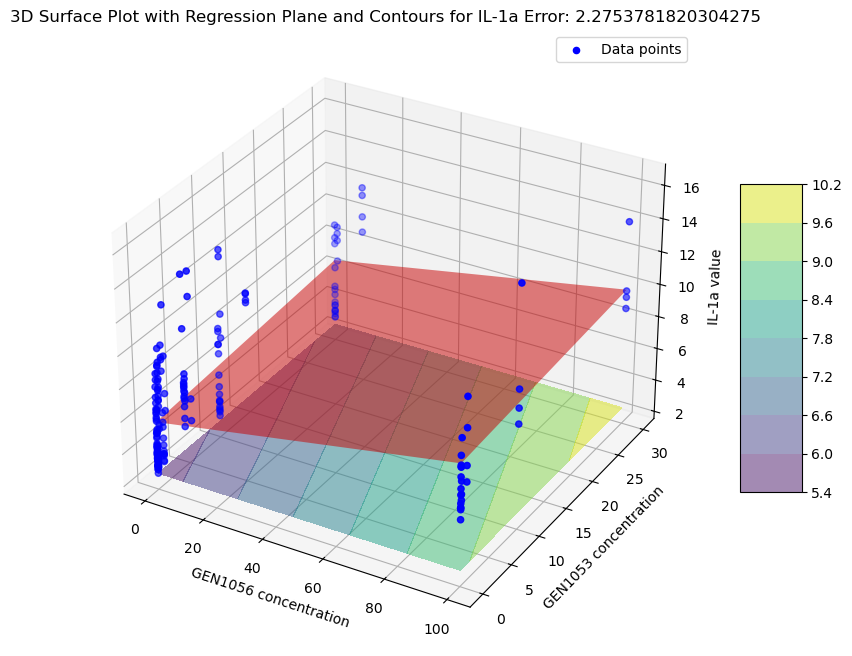

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


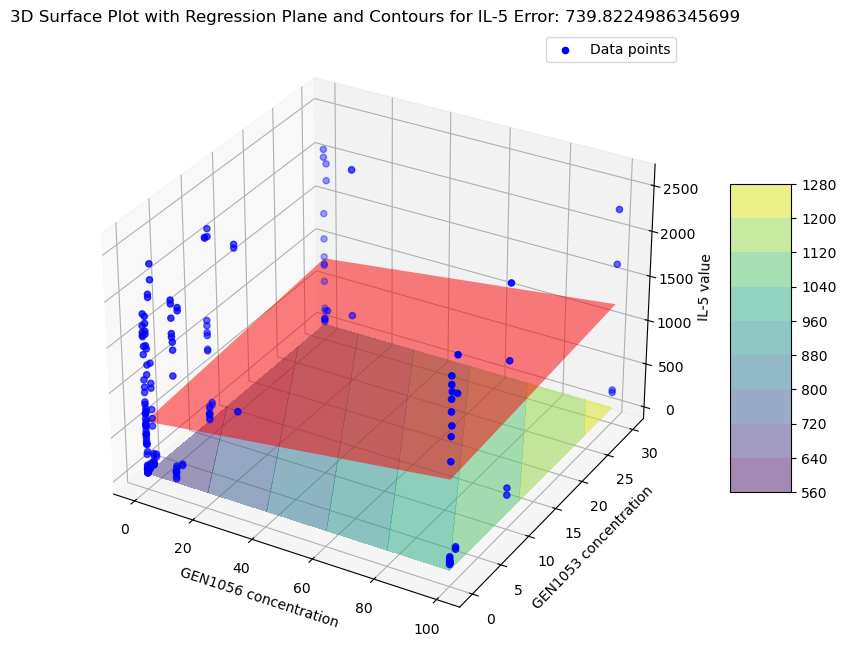

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


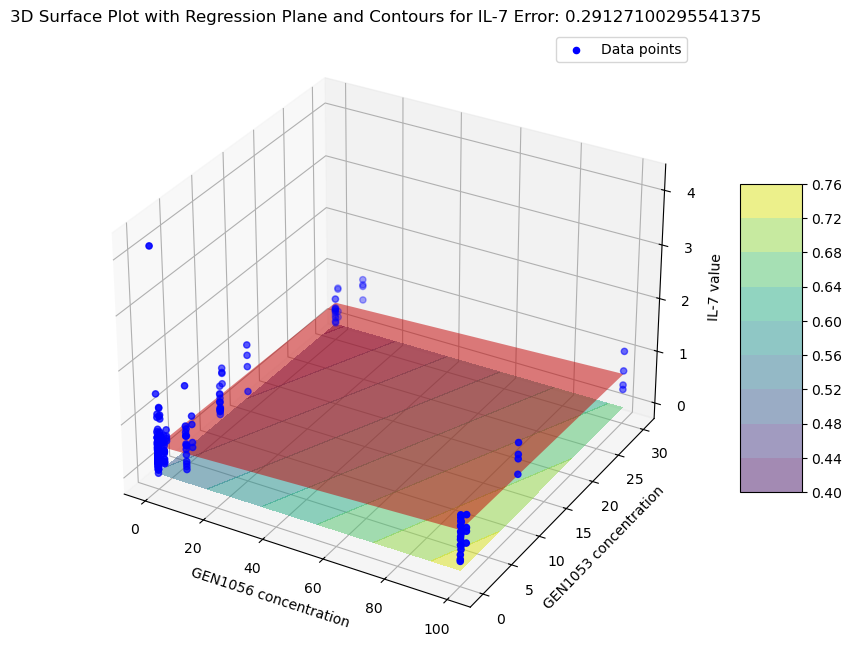

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


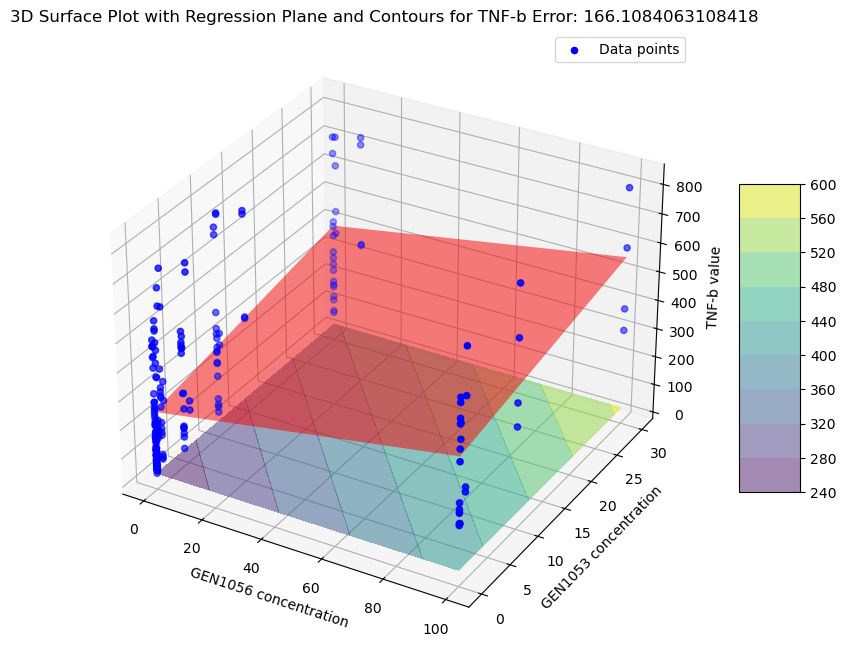

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


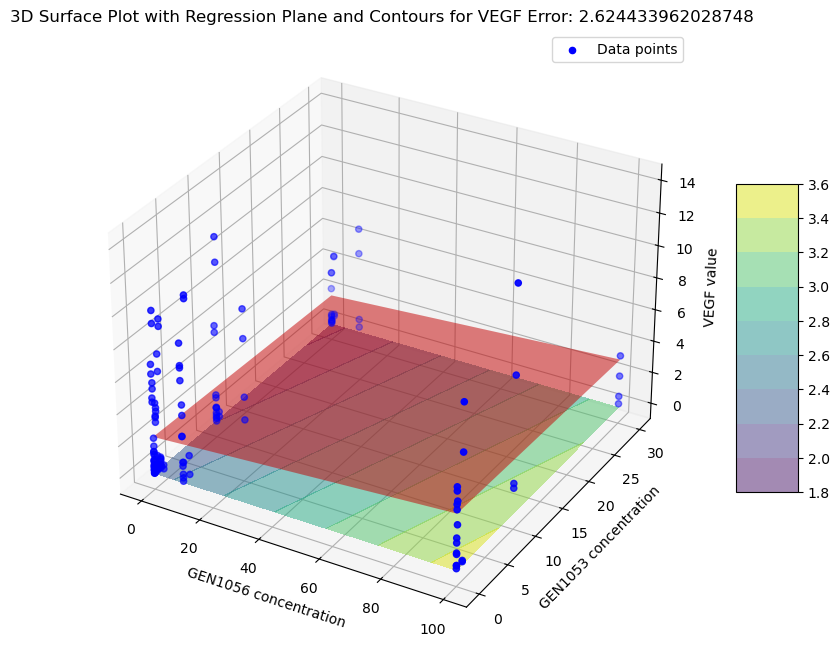

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


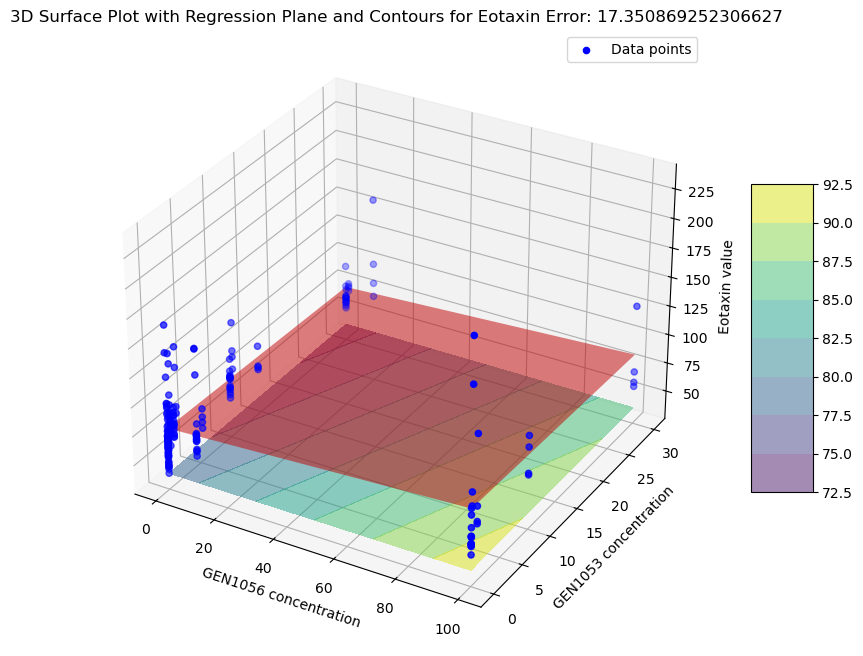

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


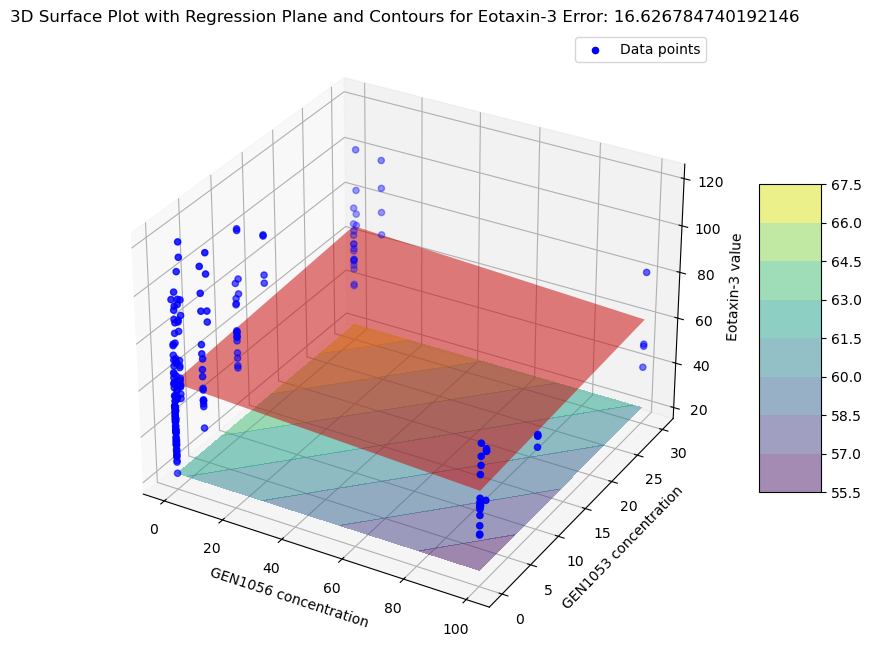

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


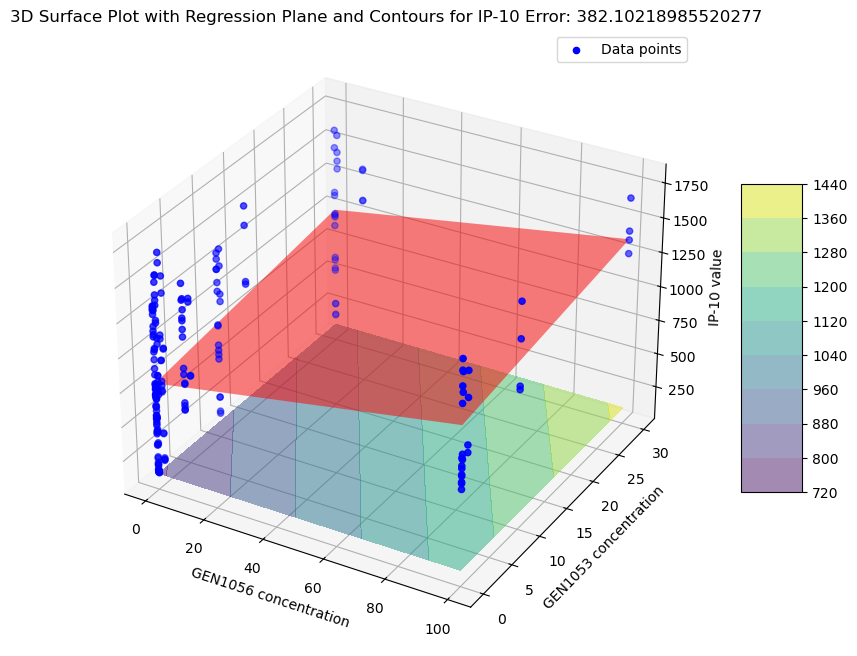

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


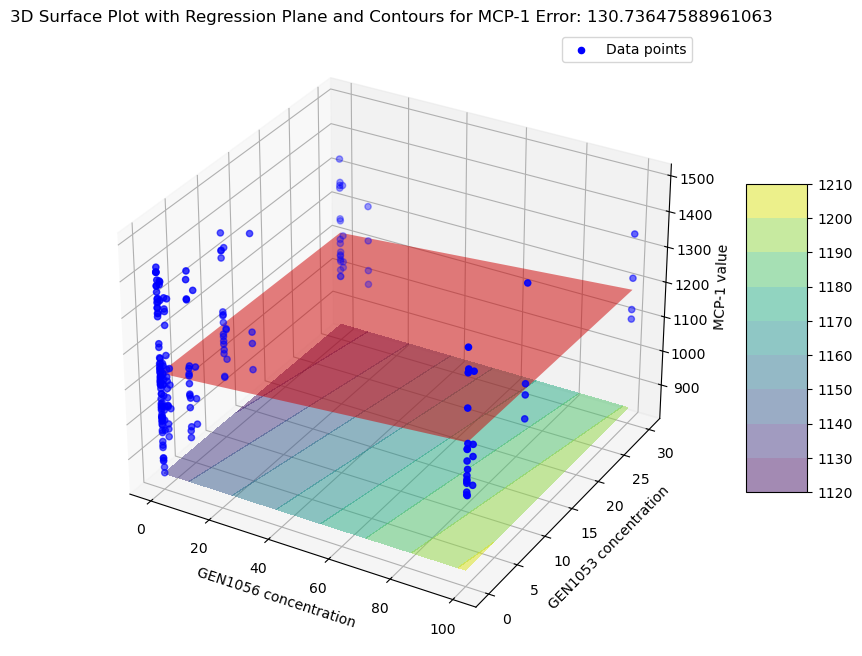

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


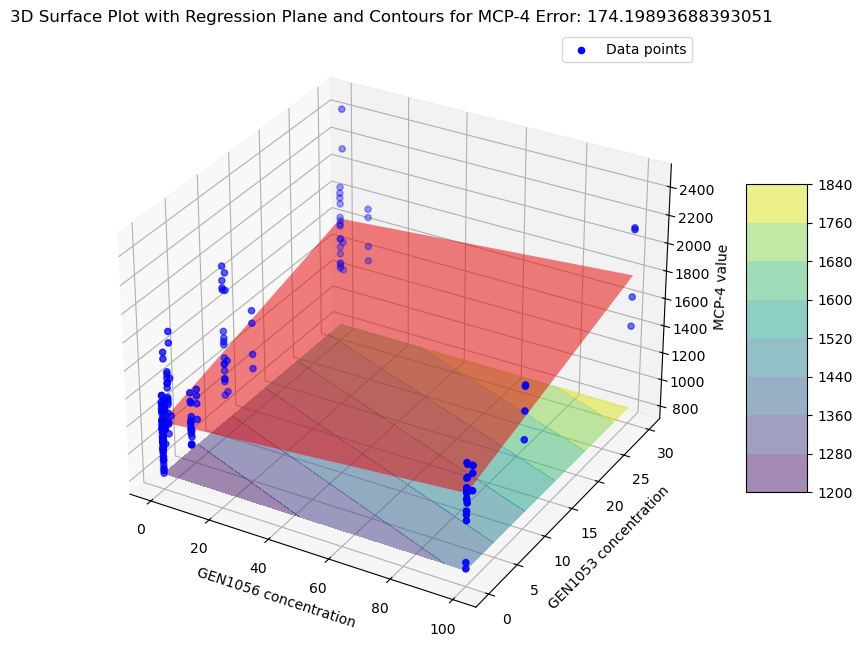

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


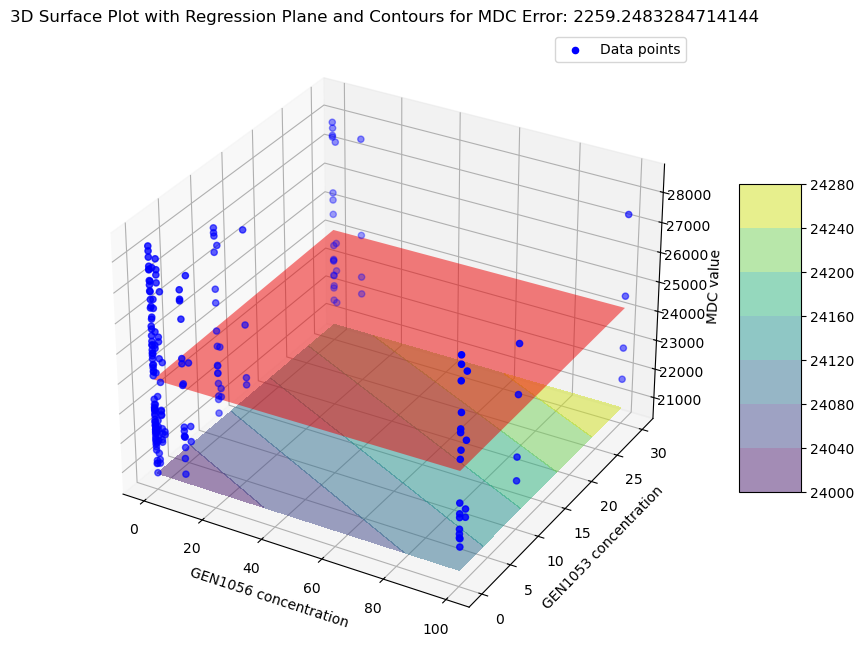

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


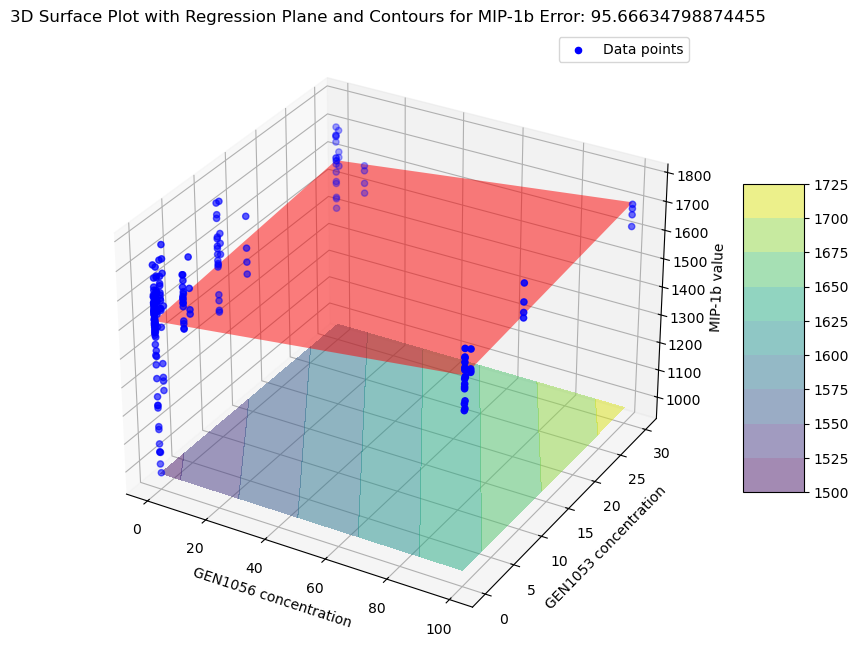

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


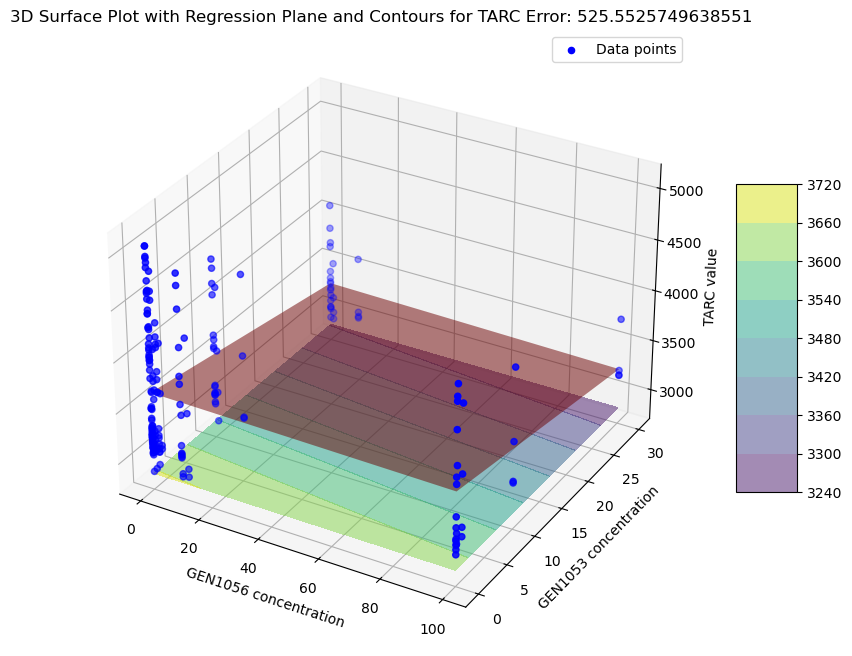

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


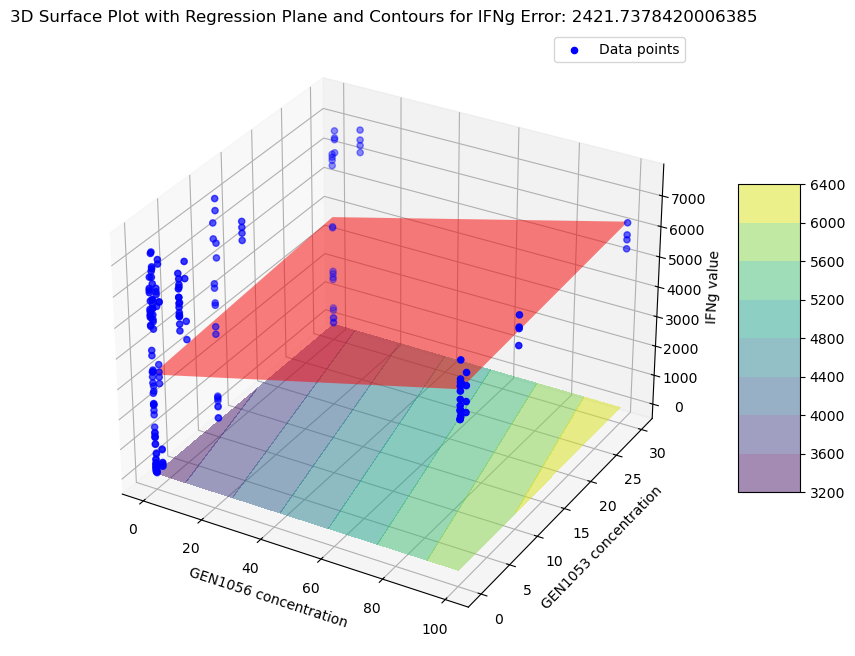

In [63]:
GEN1056_GEN1053_error_table = {}
analytes = []
errors = [[],[],[]]
for dimension in range (1,4):
    for analyte in unique_analytes:
        if plotable("GEN1056", "GEN1053", analyte):
            plot("GEN1056", "GEN1053", analyte)
            if analyte not in analytes:
                analytes.append(analyte)
            errors[dimension-1].append(float(cross_val_mae("GEN1056", "GEN1053", analyte, dimension=dimension)))
    GEN1056_GEN1053_error_table["dimension "+str(dimension)+" error"] = errors[dimension-1]
GEN1056_GEN1053_error_table["analyte"]=analytes
GEN1056_GEN1053_error_table = pd.DataFrame(GEN1056_GEN1053_error_table)
GEN1056_GEN1053_error_table["minimum"]=GEN1056_GEN1053_error_table[["dimension 1 error","dimension 2 error", "dimension 3 error"]].min(axis=1)
GEN1056_GEN1053_error_table["minimum_id"]=GEN1056_GEN1053_error_table[["dimension 1 error","dimension 2 error", "dimension 3 error"]].idxmin(axis=1)

In [59]:
GEN1053_Pembrolizumab_error_table = {}
analytes = []
errors = [[],[],[]]
for dimension in range (1,4):
    for analyte in unique_analytes:
        if plotable("GEN1053", "Pembrolizumab", analyte):
            plot("GEN1053", "Pembrolizumab", analyte)
            if analyte not in analytes:
                analytes.append(analyte)
            errors[dimension-1].append(float(cross_val_mae("GEN1053", "Pembrolizumab", analyte, dimension=dimension)))
    GEN1053_Pembrolizumab_error_table["dimension "+str(dimension)+" error"] = errors[dimension-1]
GEN1053_Pembrolizumab_error_table["analyte"]=analytes
GEN1053_Pembrolizumab_error_table = pd.DataFrame(GEN1053_Pembrolizumab_error_table)
GEN1053_Pembrolizumab_error_table["minimum"]=GEN1053_Pembrolizumab_error_table[["dimension 1 error","dimension 2 error", "dimension 3 error"]].min(axis=1)
GEN1053_Pembrolizumab_error_table["minimum_id"]=GEN1053_Pembrolizumab_error_table[["dimension 1 error","dimension 2 error", "dimension 3 error"]].idxmin(axis=1)

In [61]:
GEN1056_GEN1053_error_table = GEN1056_GEN1053_error_table.sort_values(by=['minimum'])
GEN1053_Pembrolizumab_error_table = GEN1053_Pembrolizumab_error_table.sort_values(by=['minimum'])

In [258]:
print(GEN1056_GEN1053_error_table)

    dimension 1 error  dimension 2 error  dimension 3 error    analyte  \
16           0.291271           0.259940           0.232648       IL-7   
11           0.734622           0.700415           0.686942      IL-15   
3            1.041783           0.964591           0.822991      IL-1b   
14           2.275378           1.872020           1.463780      IL-1a   
0            1.907243           1.840410           1.627258      IL-10   
18           2.624434           2.556320           2.444699       VEGF   
5            3.358099           3.417569           3.512243       IL-4   
4            5.740867           4.908727           4.018163       IL-2   
1            5.894889           5.642833           5.316182   IL-12p70   
20          16.626785          14.722817          11.004793  Eotaxin-3   
19          17.350869          16.704634          15.467853    Eotaxin   
12          44.158318          42.419838          42.363830      IL-16   
13          48.464891          48.5174

In [259]:
print(GEN1053_Pembrolizumab_error_table)

    dimension 1 error  dimension 2 error  dimension 3 error     analyte  \
2            0.605067           0.626142           0.653576       IL-1b   
10           2.068728           2.137933           2.224721       IL-15   
50           3.155247           3.255719           3.477990    Siglec-7   
51           4.276893           4.397847           4.733542    Siglec-9   
32           4.352817           4.691607           4.337007       CD40L   
..                ...                ...                ...         ...   
13        4975.661967        5163.697758        5531.634365       MCP-1   
43        6059.035945        6267.468601        6740.100468  Galectin-1   
1         7859.695248        8009.036212        8449.783559       IL-13   
14        9099.112030        9291.884131        9389.697679         MDC   
40        9962.025832       10279.655510       10936.772496  Granzyme B   

        minimum         minimum_id  
2      0.605067  dimension 1 error  
10     2.068728  dimensio